In [1]:
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

In [2]:
sns.set(font_scale=2.5)
pd.set_option('display.max_columns', None)

In [3]:
APPROACH_COLUMN = "Approach"
TOTAL_SECONDS_MEAN_COLUMN = "Total Seconds Mean"
AVG_MAE_MEAN_COLUMN = "Avg_MAE Mean"
AVG_MSE_MEAN_COLUMN = "Avg_MSE Mean"
AVG_MAPE_MEAN_COLUMN = "Avg_MAPE Mean"
RANK_COLUMN = "Rank"
SCORE_COLUMN = "Score"

In [4]:
FIXED_APPROACHES = ["Full", "Fixed Cut 5.0%", "Fixed Cut 10.0%", "Fixed Cut 15.0%", "Fixed Cut 20.0%", "Fixed Cut 25.0%",
                    "Fixed Cut 30.0%", "Fixed Cut 35.0%", "Fixed Cut 40.0%", "Fixed Cut 45.0%", "Fixed Cut 50.0%",
                    "Fixed Cut 55.0%", "Fixed Cut 60.0%", "Fixed Cut 65.0%", "Fixed Cut 70.0%", "Fixed Cut 75.0%",
                    "Fixed Cut 80.0%", "Fixed Cut 85.0%", "Fixed Cut 90.0%"]
WINDOW_APPROACHES = ["Window L1", "Window L2", "Window Normal", "Window RBF", "Window Cosine", "Window Linear",
                     "Window Clinear", "Window Rank", "Window Mahalanobis", "Window AR", "Window Mean",
                     "Window Median"]
BINARY_SEG_APPROACHES = ["Binary Segmentation L1", "Binary Segmentation L2", "Binary Segmentation Normal", 
                         "Binary Segmentation RBF", "Binary Segmentation Cosine", "Binary Segmentation Linear",
                         "Binary Segmentation Clinear", "Binary Segmentation Rank", "Binary Segmentation Mahalanobis",
                         "Binary Segmentation AR", "Binary Segmentation Mean", "Binary Segmentation Median"]
BOTTOM_UP_APPROACHES = ["Bottom Up L1", "Bottom Up L2", "Bottom Up Normal", "Bottom Up RBF", "Bottom Up Cosine", 
                        "Bottom Up Linear", "Bottom Up Clinear", "Bottom Up Rank", "Bottom Up Mahalanobis", 
                        "Bottom Up AR", "Bottom Up Mean", "Bottom Up Median"]

In [5]:
def get_rank_df(df):
    scaler = MinMaxScaler()
    rank_df = df.copy()
    columns = [TOTAL_SECONDS_MEAN_COLUMN, AVG_MAE_MEAN_COLUMN, AVG_MSE_MEAN_COLUMN]
    rank_df[columns] = pd.DataFrame(scaler.fit_transform(rank_df[columns]))
    rank_df = rank_df[[APPROACH_COLUMN] + columns]
    rank_df[SCORE_COLUMN] = rank_df[columns[0]] + rank_df[columns[1]] + rank_df[columns[2]]
    rank_df[RANK_COLUMN] = rank_df[SCORE_COLUMN].rank(ascending=True)
    return rank_df

In [6]:
def get_average_std_df(folder_path, prefix):
    file_list = os.listdir(folder_path)
    csv_files = [file for file in file_list if file.startswith(prefix) and file.lower().endswith(".csv")]
    dataframes = []
    for filename in csv_files:
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)
        dataframes.append(df)
    merged_df = pd.concat(dataframes)
    final_df = merged_df.groupby(APPROACH_COLUMN).agg(["mean", "std"]).reset_index()
    columns = [APPROACH_COLUMN]
    for col in merged_df.columns[1:]:
        columns.append(f"{col} Mean")
        columns.append(f"{col} Std")
    final_df.columns = columns
    return final_df

## Embrapa

In [7]:
shape = pd.read_csv("datasets/embrapa/pantanal_climate.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 8766 rows and 7 columns


In [8]:
df = get_average_std_df("outputs/EMBRAPA/", "PANTANAL_CLIMATE")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,T_MAPE Mean,T_MAPE Std,T_MAE Mean,T_MAE Std,T_MSE Mean,T_MSE Std,UR_MAPE Mean,UR_MAPE Std,UR_MAE Mean,UR_MAE Std,UR_MSE Mean,UR_MSE Std,V_MAPE Mean,V_MAPE Std,V_MAE Mean,V_MAE Std,V_MSE Mean,V_MSE Std,P_MAPE Mean,P_MAPE Std,P_MAE Mean,P_MAE Std,P_MSE Mean,P_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,6922.0,0.0,1754.0,0.0,90.0,0.0,1.283514,0.0,1.246728,0.105910,392.237731,55.826691,23.049862,12.376844,416.534322,61.998835,0.130385,0.004861,0.097888,0.002851,0.014393,0.000508,0.254159,0.000766,0.146653,0.002617,0.031897,0.000681,0.428219,0.019677,0.068230,0.007128,0.006312,0.001054,1.821286,0.739056,0.025637,0.010864,0.002042,0.000211,0.658512,0.184621,0.084602,0.004030,0.013661,0.000391
1,Binary Segmentation Clinear,6832.0,0.0,1754.0,0.0,180.0,0.0,2.567028,0.0,0.487996,0.084497,435.165015,150.662482,24.063632,12.713655,459.716643,147.065532,0.127281,0.006806,0.096181,0.003875,0.014238,0.000581,0.253763,0.002642,0.143431,0.002921,0.031113,0.000851,0.449445,0.029064,0.076449,0.010682,0.007697,0.001746,2.442609,1.870877,0.022873,0.006222,0.001940,0.000123,0.818275,0.472765,0.084733,0.001814,0.013747,0.000263
2,Binary Segmentation Cosine,5727.0,0.0,1754.0,0.0,1285.0,0.0,18.325727,0.0,72.045570,8.312469,393.436652,66.094910,18.903530,10.567333,484.385751,71.245321,0.122083,0.006339,0.093386,0.003607,0.013885,0.000478,0.253224,0.001484,0.145645,0.004204,0.031517,0.000976,0.451862,0.028650,0.077466,0.010775,0.007883,0.001849,1.575863,0.512187,0.025718,0.005844,0.001942,0.000140,0.600758,0.134169,0.085554,0.001798,0.013807,0.000353
3,Binary Segmentation L1,6922.0,0.0,1754.0,0.0,90.0,0.0,1.283514,0.0,1.442744,0.247282,413.207187,66.335703,23.411938,8.027411,438.061869,72.422883,0.121783,0.004672,0.093218,0.002338,0.013841,0.000104,0.254793,0.002816,0.145283,0.004605,0.031691,0.001345,0.438746,0.008598,0.071986,0.003040,0.006870,0.000459,2.733048,2.289969,0.021142,0.003582,0.001930,0.000146,0.887092,0.570917,0.082907,0.001135,0.013583,0.000313
4,Binary Segmentation L2,6922.0,0.0,1754.0,0.0,90.0,0.0,1.283514,0.0,0.397314,0.032359,434.124102,109.161464,14.934665,5.951972,449.456081,108.064175,0.130395,0.005336,0.097570,0.002740,0.014192,0.000386,0.253826,0.000973,0.146175,0.002199,0.031672,0.000535,0.443227,0.025212,0.074133,0.009217,0.007318,0.001512,21.119622,40.260775,0.019803,0.004570,0.001915,0.000119,5.486768,10.066019,0.084420,0.001194,0.013774,0.000358


### Fixed cuts

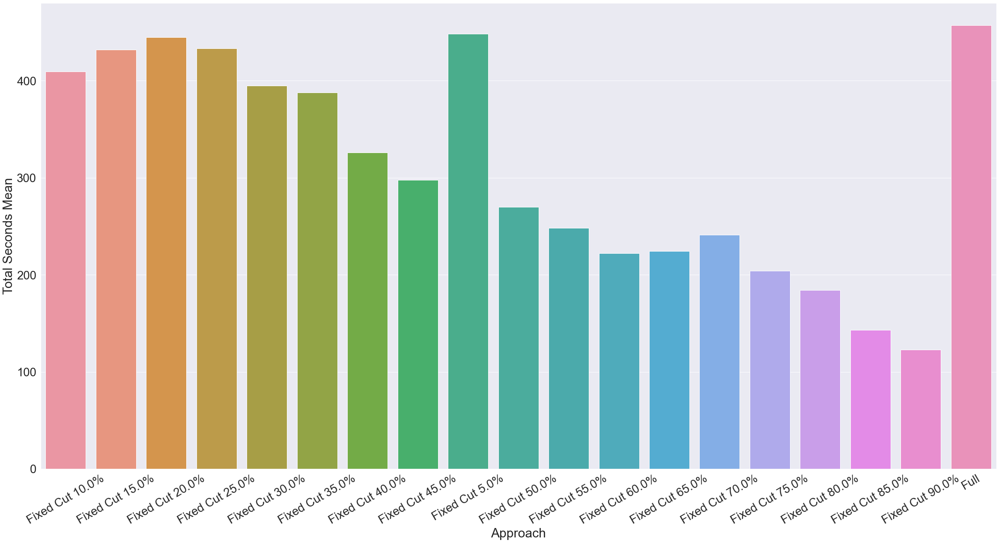

In [9]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN,
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

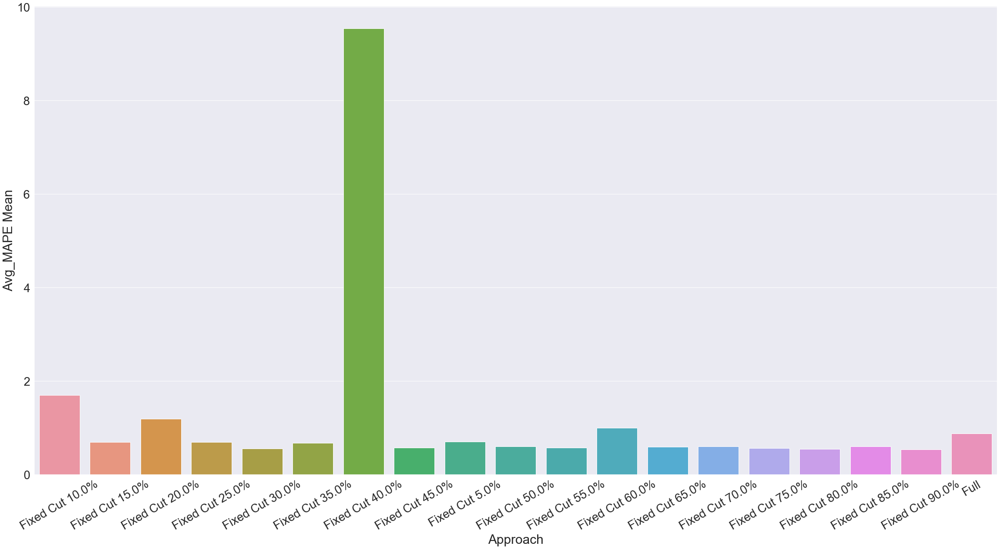

In [10]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

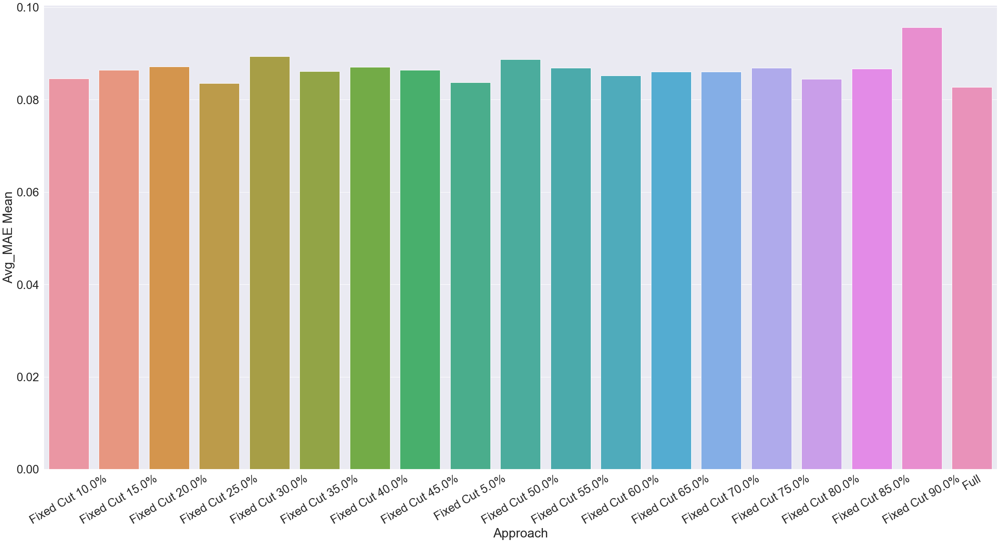

In [11]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

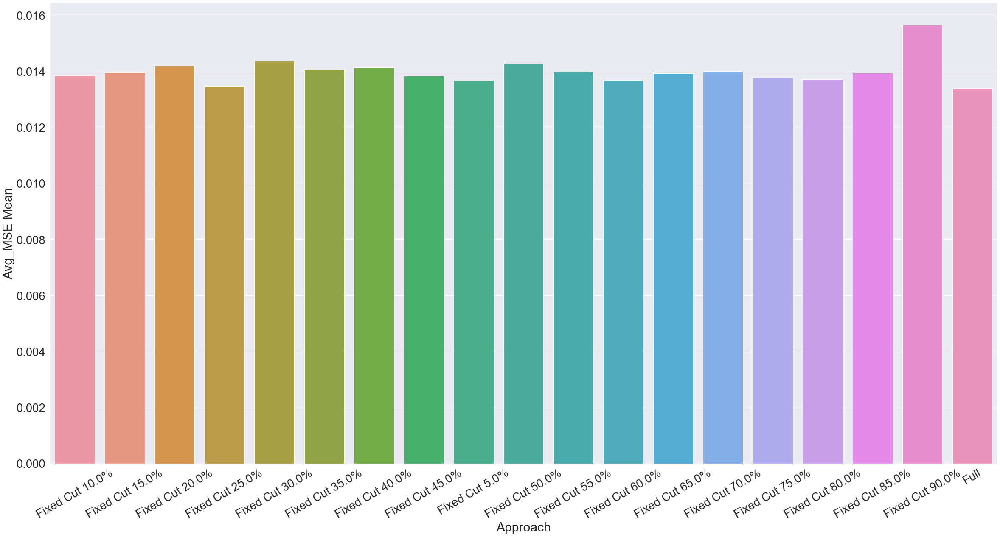

In [12]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

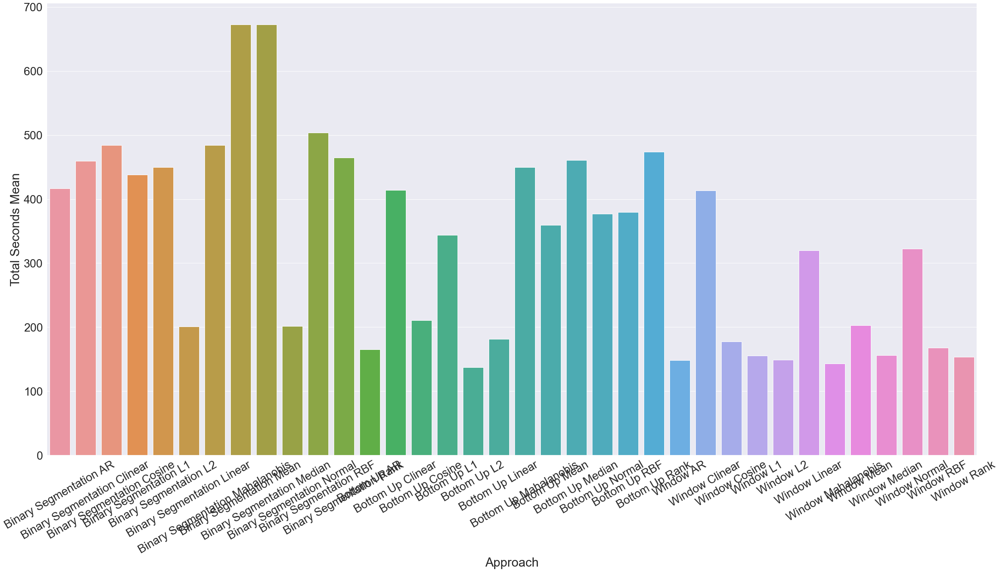

In [13]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

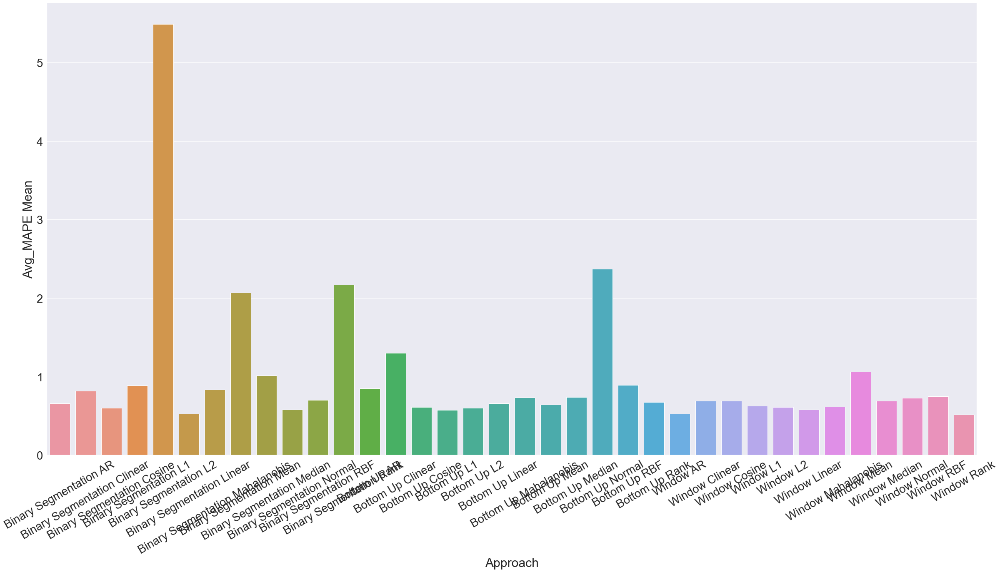

In [14]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

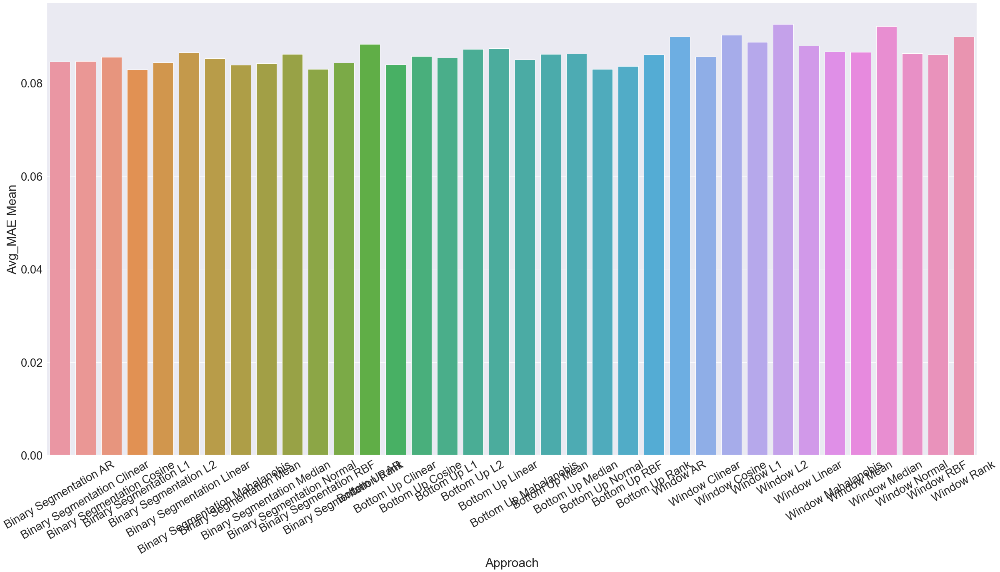

In [15]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

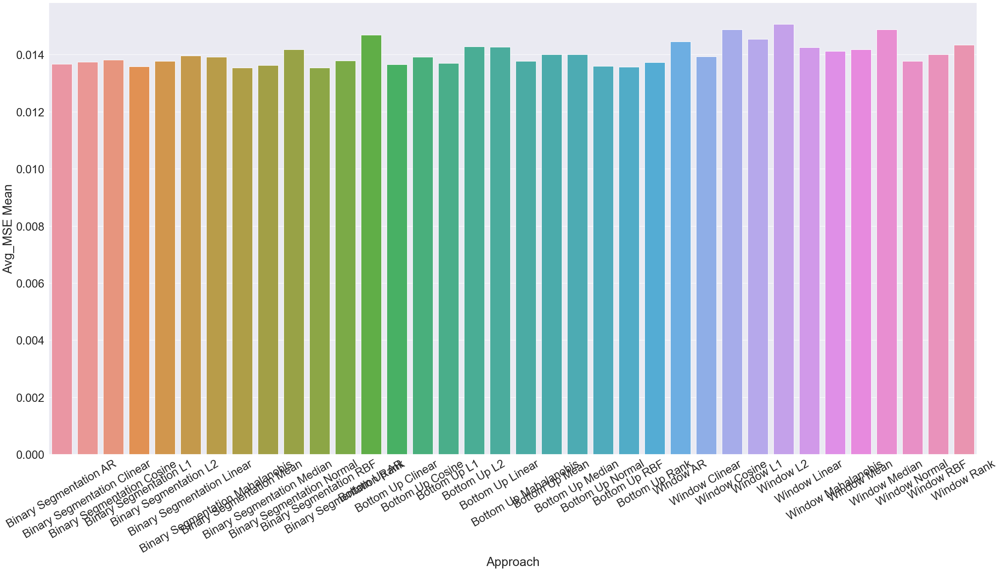

In [16]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [17]:
rank_df = get_rank_df(df)

In [18]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
39,Fixed Cut 80.0%,0.386441
35,Fixed Cut 60.0%,0.502548
21,Bottom Up Normal,0.566080
40,Fixed Cut 85.0%,0.586562
53,Window RBF,0.603971
22,Bottom Up RBF,0.604795
42,Full,0.608468
14,Bottom Up Cosine,0.622053
38,Fixed Cut 75.0%,0.637032
27,Fixed Cut 25.0%,0.648941


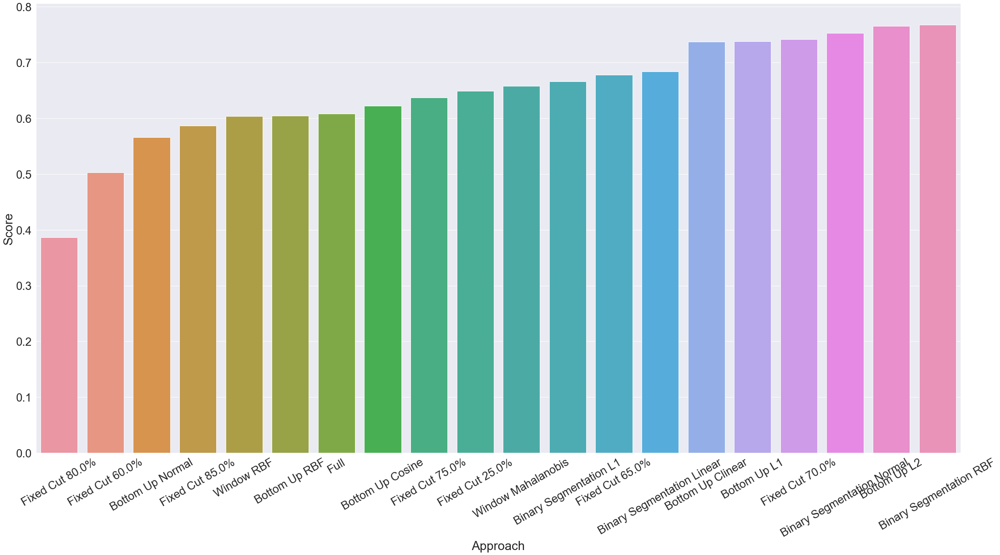

In [19]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [20]:
embrapa_rank_df = rank_df

## PRSA Beijing

In [21]:
shape = pd.read_csv("datasets/uci/prsa_beijing.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 43824 rows and 10 columns


In [22]:
df = get_average_std_df("outputs/UCI/", "PRSA_BEIJING")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,DEWP_MAPE Mean,DEWP_MAPE Std,DEWP_MAE Mean,DEWP_MAE Std,DEWP_MSE Mean,DEWP_MSE Std,TEMP_MAPE Mean,TEMP_MAPE Std,TEMP_MAE Mean,TEMP_MAE Std,TEMP_MSE Mean,TEMP_MSE Std,PRES_MAPE Mean,PRES_MAPE Std,PRES_MAE Mean,PRES_MAE Std,PRES_MSE Mean,PRES_MSE Std,Iws_MAPE Mean,Iws_MAPE Std,Iws_MAE Mean,Iws_MAE Std,Iws_MSE Mean,Iws_MSE Std,Is_MAPE Mean,Is_MAPE Std,Is_MAE Mean,Is_MAE Std,Is_MSE Mean,Is_MSE Std,Ir_MAPE Mean,Ir_MAPE Std,Ir_MAE Mean,Ir_MAE Std,Ir_MSE Mean,Ir_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,1244.0,0.0,8765.0,0.0,33815.0,0.0,96.451696,0.0,31.727511,5.219306,139.661203,34.496161,5.524038,1.754533,176.912753,41.117106,1.536529,0.089861,0.490539,0.006640,0.335434,0.008861,7.564741,3.785956,0.793876,0.020929,0.924945,0.047394,0.295437,0.348159,0.052363,0.042790,0.013254,0.009699,0.906228,0.048511,0.080367,0.016149,0.012518,0.003694,2.174760,1.044155,0.047939,0.007491,0.480041,0.038138,16.816805,21.280739,0.151342,0.014102,1.138079,0.079066,4.882417,3.413151,0.269404,0.007107,0.484045,0.010663
1,Binary Segmentation Clinear,2139.0,0.0,8765.0,0.0,32920.0,0.0,93.898856,0.0,7.838546,1.531634,169.703427,22.616601,10.420103,3.616049,187.962076,23.834870,2.456346,0.287314,0.389275,0.012761,0.212785,0.014010,1.276911,0.070770,0.402001,0.006825,0.222101,0.007301,0.067888,0.045282,0.019404,0.008502,0.004106,0.002844,0.872602,0.022678,0.060752,0.010718,0.008374,0.001510,1.865584,0.675819,0.041204,0.001998,0.512770,0.035573,5.000711,3.480528,0.077819,0.003656,0.284167,0.012370,1.923340,0.570124,0.165076,0.004079,0.207384,0.007829
2,Binary Segmentation Cosine,22659.0,0.0,8765.0,0.0,12400.0,0.0,35.368949,0.0,6599.627642,941.988016,1151.567846,190.708433,95.004183,51.813867,7846.199671,1152.169475,31.621417,18.788316,0.325254,0.002052,0.140538,0.001801,0.692937,0.020643,0.232200,0.002184,0.072198,0.001302,0.007611,0.002743,0.007366,0.002617,0.000078,0.000045,0.897995,0.027594,0.042816,0.003080,0.006633,0.000174,1.109773,0.108715,0.005530,0.002327,0.001179,0.000020,1.344677,0.285210,0.009410,0.002676,0.000958,0.000033,5.945735,3.112463,0.103763,0.001057,0.036931,0.000381
3,Binary Segmentation L1,32959.0,0.0,8765.0,0.0,2100.0,0.0,5.989903,0.0,21.030753,2.074215,1442.444266,249.586404,108.444262,53.463723,1571.919281,297.860382,43.843609,30.750737,0.325841,0.002809,0.139274,0.003129,0.726533,0.043482,0.218248,0.003101,0.063554,0.001639,0.008604,0.003106,0.008365,0.003027,0.000109,0.000068,0.902513,0.080342,0.037793,0.005228,0.004723,0.000066,1.188675,0.240832,0.003670,0.001150,0.001017,0.000014,1.311482,0.146674,0.007269,0.002262,0.000750,0.000010,7.996903,5.120106,0.100198,0.001488,0.034904,0.000513
4,Binary Segmentation L2,22659.0,0.0,8765.0,0.0,12400.0,0.0,35.368949,0.0,3.789129,0.432593,1115.911986,234.620862,113.328008,39.171553,1233.029123,266.576560,61.129380,61.212124,0.322386,0.002918,0.137887,0.002266,0.671066,0.027567,0.227496,0.002742,0.069599,0.001445,0.007403,0.002042,0.007204,0.002009,0.000079,0.000042,0.942642,0.070274,0.040276,0.003628,0.006619,0.000074,1.051584,0.037805,0.008409,0.006687,0.001212,0.000143,1.123757,0.036279,0.012784,0.004369,0.000978,0.000087,10.820972,10.197188,0.103092,0.001301,0.036062,0.000451


### Fixed cuts

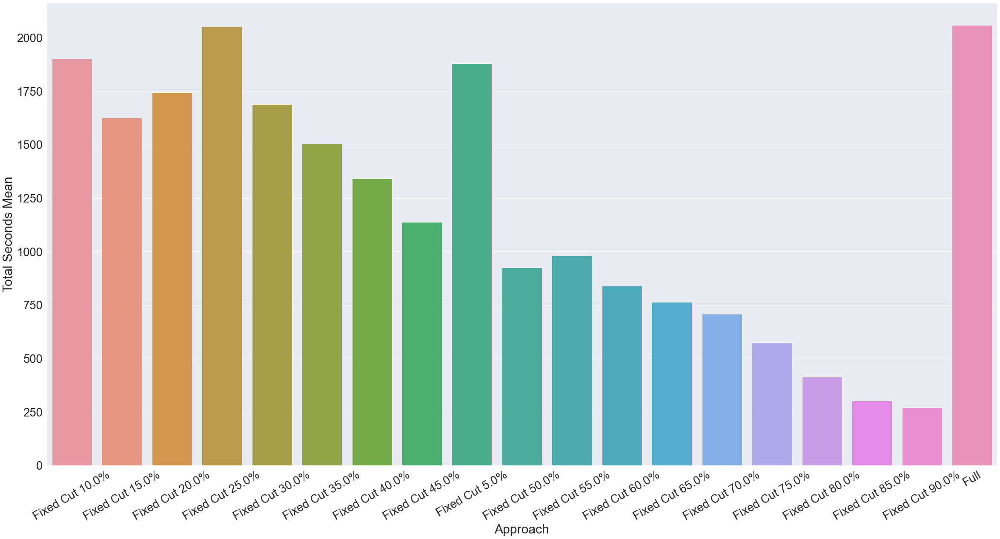

In [23]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

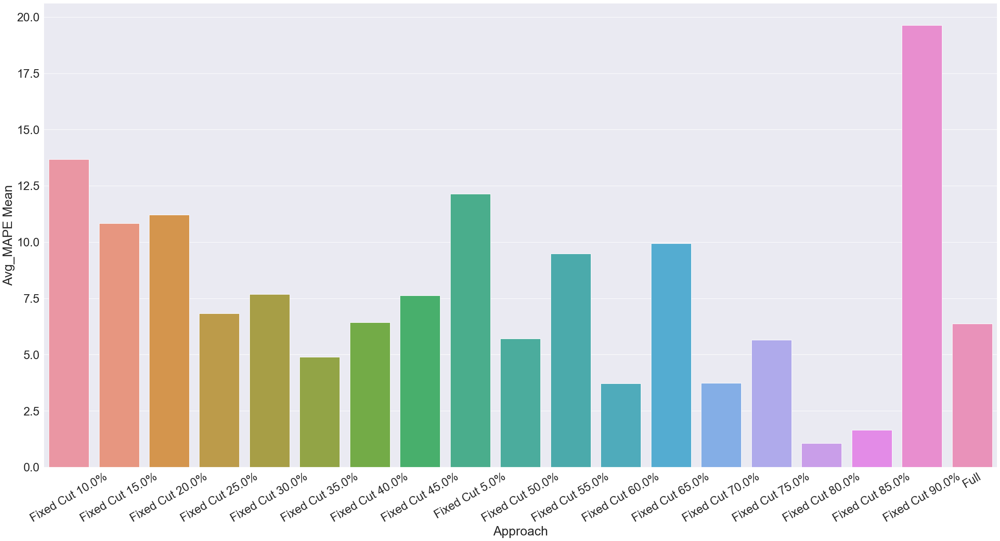

In [24]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

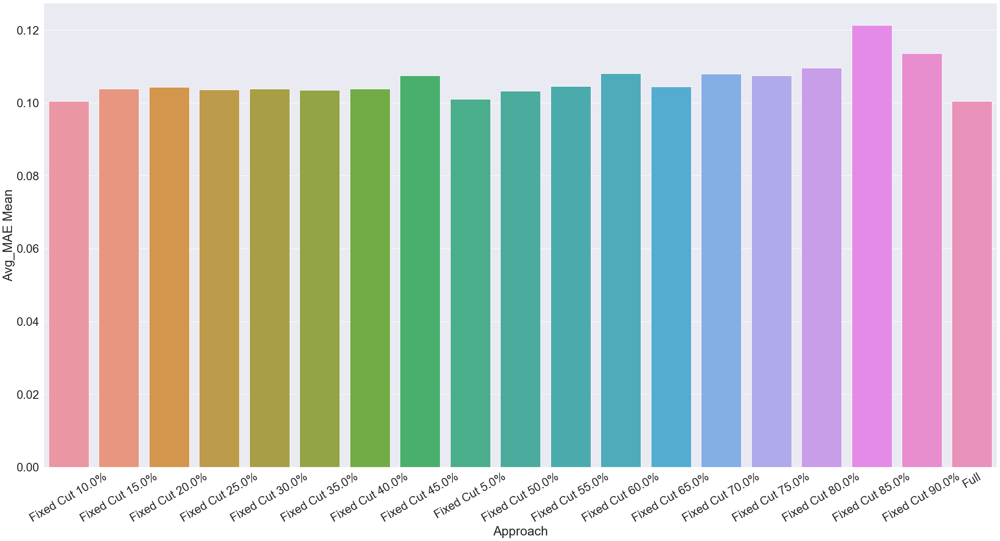

In [25]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

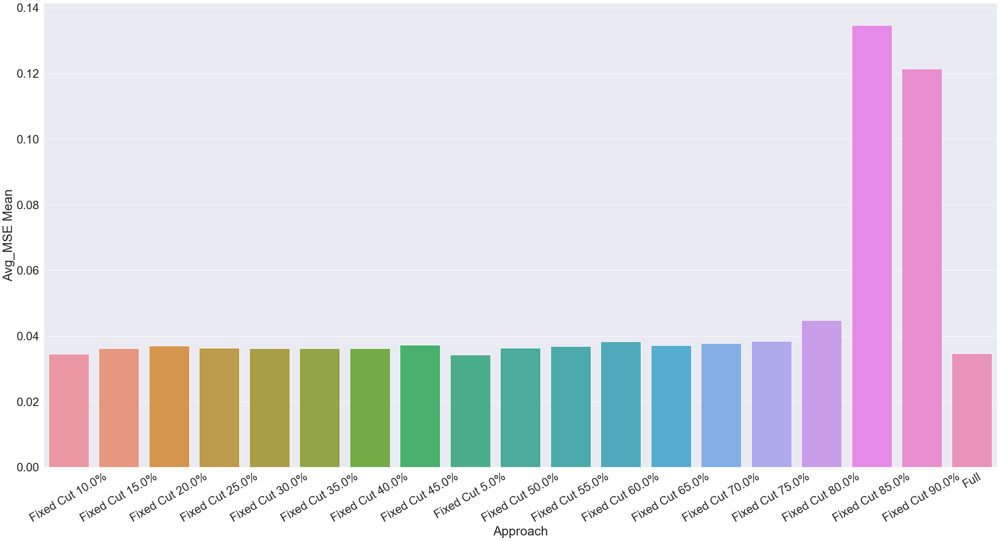

In [26]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

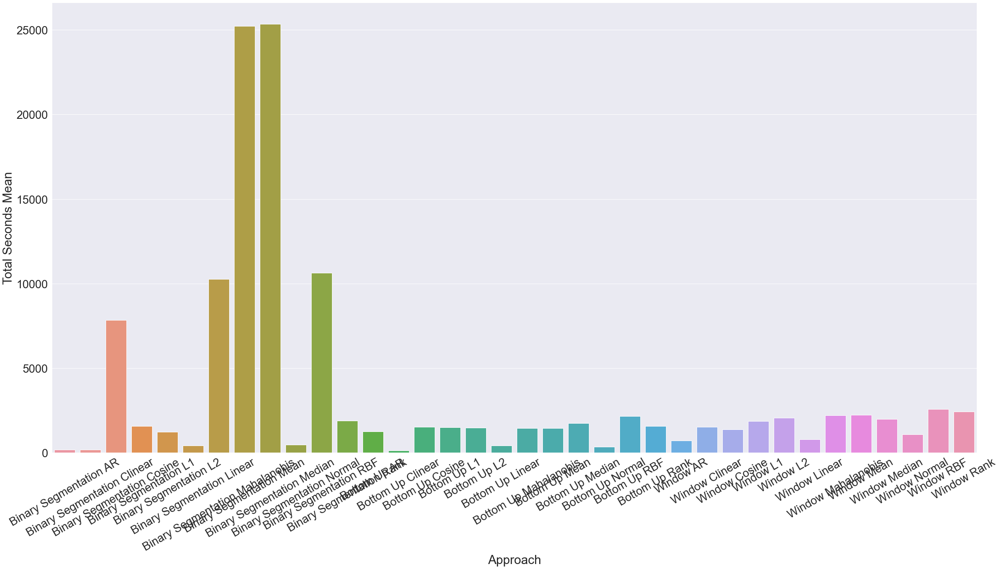

In [27]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

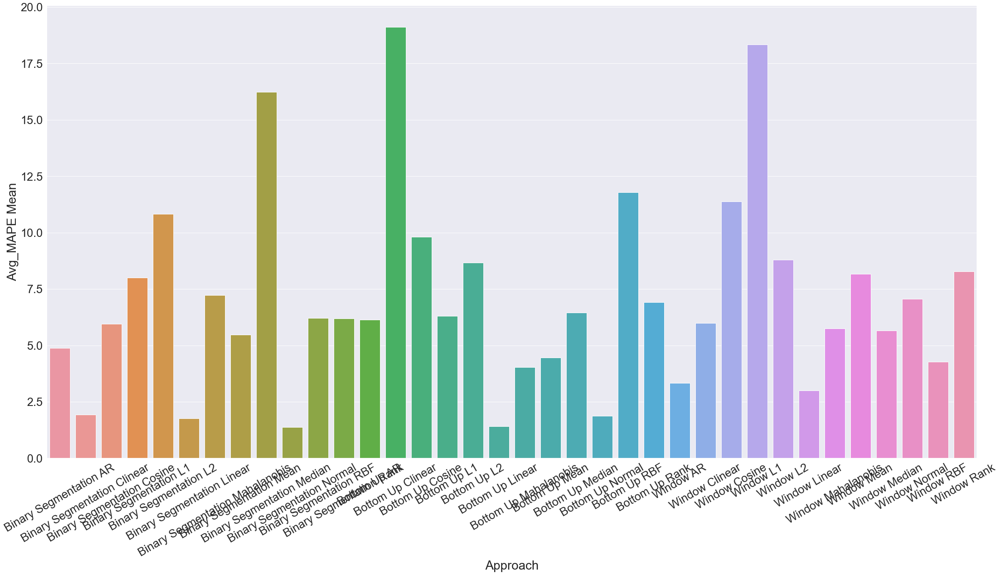

In [28]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

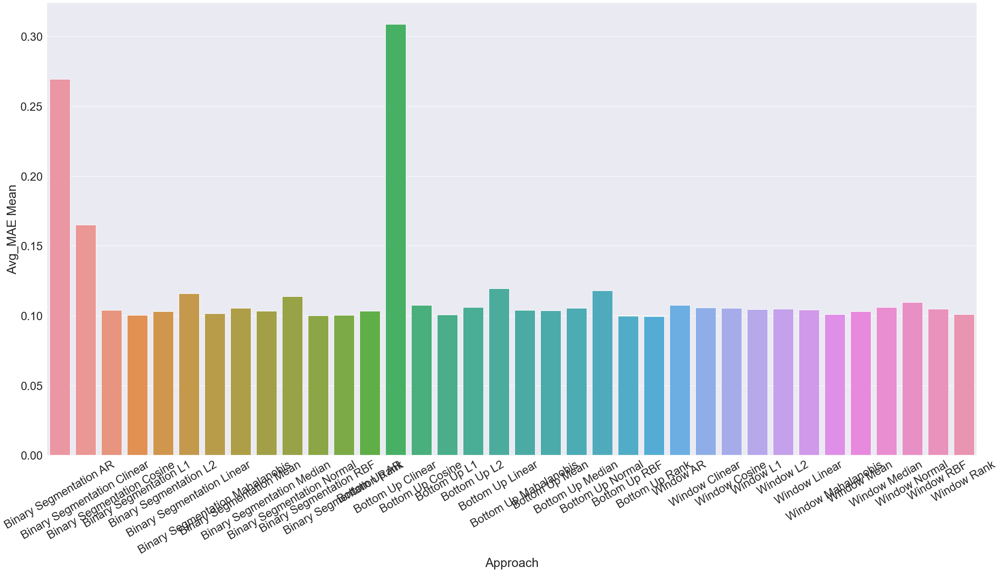

In [29]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

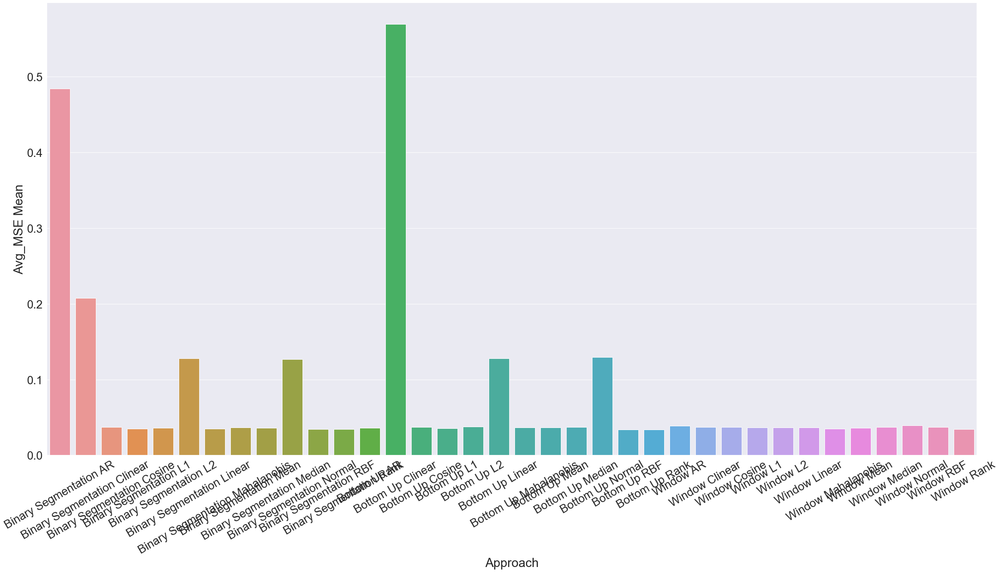

In [30]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [31]:
rank_df = get_rank_df(df)

In [32]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
33,Fixed Cut 50.0%,0.054286
48,Window Linear,0.054690
36,Fixed Cut 65.0%,0.055079
23,Bottom Up Rank,0.057790
3,Binary Segmentation L1,0.062753
15,Bottom Up L1,0.063074
34,Fixed Cut 55.0%,0.063774
38,Fixed Cut 75.0%,0.064414
4,Binary Segmentation L2,0.065321
12,Bottom Up AR,0.067691


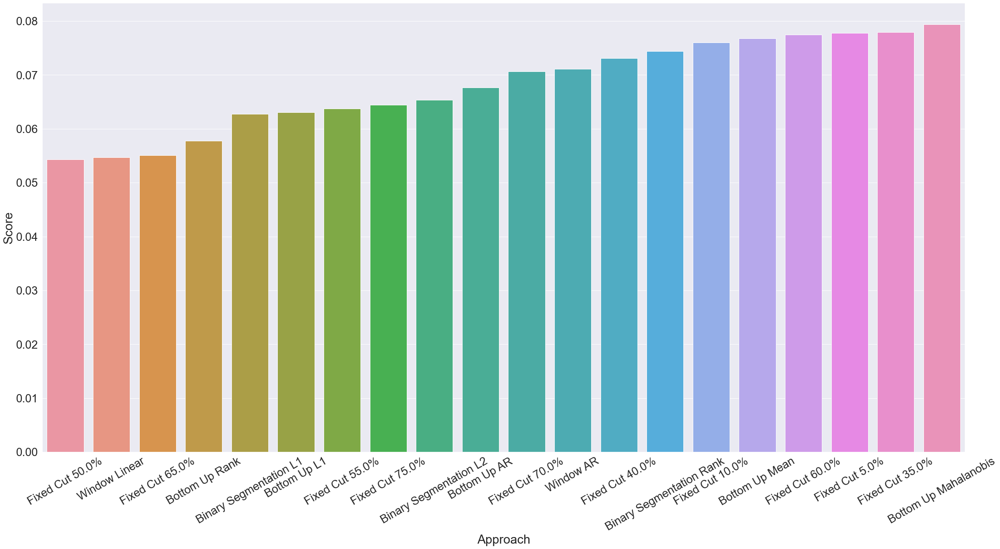

In [33]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [34]:
prsa_beijing_rank_df = rank_df

## Air Quality

In [35]:
shape = pd.read_csv("datasets/uci/air_quality.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 9357 rows and 14 columns


In [36]:
df = get_average_std_df("outputs/UCI/", "AIR_QUALITY")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,CO(GT)_MAPE Mean,CO(GT)_MAPE Std,CO(GT)_MAE Mean,CO(GT)_MAE Std,CO(GT)_MSE Mean,CO(GT)_MSE Std,NMHC(GT)_MAPE Mean,NMHC(GT)_MAPE Std,NMHC(GT)_MAE Mean,NMHC(GT)_MAE Std,NMHC(GT)_MSE Mean,NMHC(GT)_MSE Std,C6H6(GT)_MAPE Mean,C6H6(GT)_MAPE Std,C6H6(GT)_MAE Mean,C6H6(GT)_MAE Std,C6H6(GT)_MSE Mean,C6H6(GT)_MSE Std,NOx(GT)_MAPE Mean,NOx(GT)_MAPE Std,NOx(GT)_MAE Mean,NOx(GT)_MAE Std,NOx(GT)_MSE Mean,NOx(GT)_MSE Std,NO2(GT)_MAPE Mean,NO2(GT)_MAPE Std,NO2(GT)_MAE Mean,NO2(GT)_MAE Std,NO2(GT)_MSE Mean,NO2(GT)_MSE Std,T_MAPE Mean,T_MAPE Std,T_MAE Mean,T_MAE Std,T_MSE Mean,T_MSE Std,RH_MAPE Mean,RH_MAPE Std,RH_MAE Mean,RH_MAE Std,RH_MSE Mean,RH_MSE Std,AH_MAPE Mean,AH_MAPE Std,AH_MAE Mean,AH_MAE Std,AH_MSE Mean,AH_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,6255.0,0.0,1872.0,0.0,1230.0,0.0,16.432866,0.0,1.784324,0.355088,360.584363,60.966488,21.701937,14.547034,384.070624,65.073983,1.166588,0.052343,0.222623,0.033215,0.065559,0.010100,0.011902,0.006638,0.008664,0.004902,0.000116,0.000098,1.306942,0.284765,0.063278,0.001754,0.037757,0.001988,1.315995,0.158599,0.125472,0.004888,0.031529,0.001672,2.293499,0.180016,0.359796,0.009695,0.165779,0.006206,1.855946,1.274994,0.082398,0.002691,0.043084,0.001990,4.136024,5.836134,0.117798,0.005777,0.058351,0.002486,1.892225,0.779925,0.057896,0.006691,0.034338,0.001169,1.747390,0.654055,0.129741,0.005445,0.054564,0.001622
1,Binary Segmentation Clinear,5715.0,0.0,1872.0,0.0,1770.0,0.0,23.647295,0.0,0.656299,0.102286,335.298686,83.972527,24.989481,10.661849,360.944467,93.686415,1.132117,0.022444,0.242843,0.022304,0.071622,0.008649,0.013794,0.010835,0.013991,0.011301,0.000337,0.000436,11.593089,19.116595,0.068607,0.008411,0.036665,0.001989,1.237292,0.257714,0.122666,0.007396,0.030480,0.002435,2.595048,0.257847,0.371841,0.009572,0.172926,0.006414,1.208633,0.270340,0.075239,0.006005,0.041562,0.002337,5.148245,4.937205,0.122355,0.007593,0.058343,0.002456,1.379666,0.136789,0.068079,0.012075,0.033310,0.001715,3.038486,2.565609,0.135703,0.005364,0.055655,0.001846
2,Binary Segmentation Cosine,6255.0,0.0,1872.0,0.0,1230.0,0.0,16.432866,0.0,89.829272,5.579701,391.206603,91.332763,28.871254,13.817100,509.907129,108.115870,1.157417,0.018095,0.222239,0.018943,0.064300,0.006731,0.015424,0.011935,0.011034,0.008324,0.000194,0.000252,4.315899,6.674644,0.065778,0.004649,0.038951,0.001444,1.271271,0.099593,0.124179,0.003143,0.031101,0.001111,2.266732,0.446330,0.357800,0.018988,0.163951,0.013262,2.044173,1.745550,0.080526,0.011413,0.044207,0.002522,1.461522,0.291363,0.118535,0.006765,0.059262,0.002046,1.731190,0.681818,0.066949,0.016873,0.035482,0.001299,1.782953,0.795724,0.130880,0.003182,0.054681,0.001429
3,Binary Segmentation L1,2110.0,0.0,1872.0,0.0,5375.0,0.0,71.810287,0.0,1.844094,0.338265,178.102798,30.745988,9.405136,3.878289,189.352028,29.997641,2.400193,0.738502,0.088622,0.016197,0.044487,0.000444,0.013895,0.008113,0.014200,0.008544,0.000461,0.000523,18.841217,22.604531,0.070574,0.006233,0.035779,0.002442,0.510088,0.005774,0.122265,0.009316,0.022976,0.002002,0.643515,0.097546,0.217019,0.016030,0.088629,0.006309,5.596210,7.093848,0.072330,0.007331,0.036902,0.003326,4.455137,6.688146,0.113591,0.000987,0.057624,0.003840,1.317019,0.178759,0.079871,0.011235,0.032814,0.002928,4.222159,3.199025,0.097309,0.005211,0.039959,0.001311
4,Binary Segmentation L2,2110.0,0.0,1872.0,0.0,5375.0,0.0,71.810287,0.0,0.484154,0.048813,182.264548,39.141618,13.631218,5.259485,196.379920,43.329265,1.598206,0.271207,0.117867,0.028316,0.045001,0.002158,0.016310,0.007124,0.016095,0.006937,0.000457,0.000385,27.582696,25.530960,0.074557,0.006714,0.035950,0.001553,0.506893,0.007076,0.119213,0.005219,0.022189,0.000960,0.732944,0.172779,0.230052,0.025851

In [37]:
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,CO(GT)_MAPE Mean,CO(GT)_MAPE Std,CO(GT)_MAE Mean,CO(GT)_MAE Std,CO(GT)_MSE Mean,CO(GT)_MSE Std,NMHC(GT)_MAPE Mean,NMHC(GT)_MAPE Std,NMHC(GT)_MAE Mean,NMHC(GT)_MAE Std,NMHC(GT)_MSE Mean,NMHC(GT)_MSE Std,C6H6(GT)_MAPE Mean,C6H6(GT)_MAPE Std,C6H6(GT)_MAE Mean,C6H6(GT)_MAE Std,C6H6(GT)_MSE Mean,C6H6(GT)_MSE Std,NOx(GT)_MAPE Mean,NOx(GT)_MAPE Std,NOx(GT)_MAE Mean,NOx(GT)_MAE Std,NOx(GT)_MSE Mean,NOx(GT)_MSE Std,NO2(GT)_MAPE Mean,NO2(GT)_MAPE Std,NO2(GT)_MAE Mean,NO2(GT)_MAE Std,NO2(GT)_MSE Mean,NO2(GT)_MSE Std,T_MAPE Mean,T_MAPE Std,T_MAE Mean,T_MAE Std,T_MSE Mean,T_MSE Std,RH_MAPE Mean,RH_MAPE Std,RH_MAE Mean,RH_MAE Std,RH_MSE Mean,RH_MSE Std,AH_MAPE Mean,AH_MAPE Std,AH_MAE Mean,AH_MAE Std,AH_MSE Mean,AH_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,6255.0,0.0,1872.0,0.0,1230.0,0.0,16.432866,0.0,1.784324,0.355088,360.584363,60.966488,21.701937,14.547034,384.070624,65.073983,1.166588,0.052343,0.222623,0.033215,0.065559,0.010100,0.011902,0.006638,0.008664,0.004902,0.000116,0.000098,1.306942,0.284765,0.063278,0.001754,0.037757,0.001988,1.315995,0.158599,0.125472,0.004888,0.031529,0.001672,2.293499,0.180016,0.359796,0.009695,0.165779,0.006206,1.855946,1.274994,0.082398,0.002691,0.043084,0.001990,4.136024,5.836134,0.117798,0.005777,0.058351,0.002486,1.892225,0.779925,0.057896,0.006691,0.034338,0.001169,1.747390,0.654055,0.129741,0.005445,0.054564,0.001622
1,Binary Segmentation Clinear,5715.0,0.0,1872.0,0.0,1770.0,0.0,23.647295,0.0,0.656299,0.102286,335.298686,83.972527,24.989481,10.661849,360.944467,93.686415,1.132117,0.022444,0.242843,0.022304,0.071622,0.008649,0.013794,0.010835,0.013991,0.011301,0.000337,0.000436,11.593089,19.116595,0.068607,0.008411,0.036665,0.001989,1.237292,0.257714,0.122666,0.007396,0.030480,0.002435,2.595048,0.257847,0.371841,0.009572,0.172926,0.006414,1.208633,0.270340,0.075239,0.006005,0.041562,0.002337,5.148245,4.937205,0.122355,0.007593,0.058343,0.002456,1.379666,0.136789,0.068079,0.012075,0.033310,0.001715,3.038486,2.565609,0.135703,0.005364,0.055655,0.001846
2,Binary Segmentation Cosine,6255.0,0.0,1872.0,0.0,1230.0,0.0,16.432866,0.0,89.829272,5.579701,391.206603,91.332763,28.871254,13.817100,509.907129,108.115870,1.157417,0.018095,0.222239,0.018943,0.064300,0.006731,0.015424,0.011935,0.011034,0.008324,0.000194,0.000252,4.315899,6.674644,0.065778,0.004649,0.038951,0.001444,1.271271,0.099593,0.124179,0.003143,0.031101,0.001111,2.266732,0.446330,0.357800,0.018988,0.163951,0.013262,2.044173,1.745550,0.080526,0.011413,0.044207,0.002522,1.461522,0.291363,0.118535,0.006765,0.059262,0.002046,1.731190,0.681818,0.066949,0.016873,0.035482,0.001299,1.782953,0.795724,0.130880,0.003182,0.054681,0.001429
3,Binary Segmentation L1,2110.0,0.0,1872.0,0.0,5375.0,0.0,71.810287,0.0,1.844094,0.338265,178.102798,30.745988,9.405136,3.878289,189.352028,29.997641,2.400193,0.738502,0.088622,0.016197,0.044487,0.000444,0.013895,0.008113,0.014200,0.008544,0.000461,0.000523,18.841217,22.604531,0.070574,0.006233,0.035779,0.002442,0.510088,0.005774,0.122265,0.009316,0.022976,0.002002,0.643515,0.097546,0.217019,0.016030,0.088629,0.006309,5.596210,7.093848,0.072330,0.007331,0.036902,0.003326,4.455137,6.688146,0.113591,0.000987,0.057624,0.003840,1.317019,0.178759,0.079871,0.011235,0.032814,0.002928,4.222159,3.199025,0.097309,0.005211,0.039959,0.001311
4,Binary Segmentation L2,2110.0,0.0,1872.0,0.0,5375.0,0.0,71.810287,0.0,0.484154,0.048813,182.264548,39.141618,13.631218,5.259485,196.379920,43.329265,1.598206,0.271207,0.117867,0.028316,0.045001,0.002158,0.016310,0.007124,0.016095,0.006937,0.000457,0.000385,27.582696,25.530960,0.074557,0.006714,0.035950,0.001553,0.506893,0.007076,0.119213,0.005219,0.022189,0.000960,0.732944,0.172779,0.230052,0.025851

### Fixed cuts

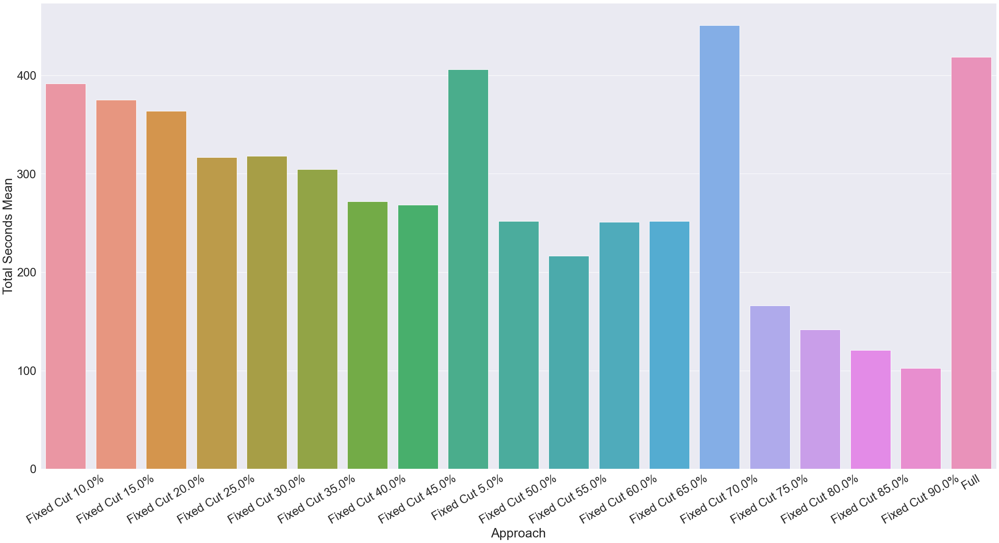

In [38]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

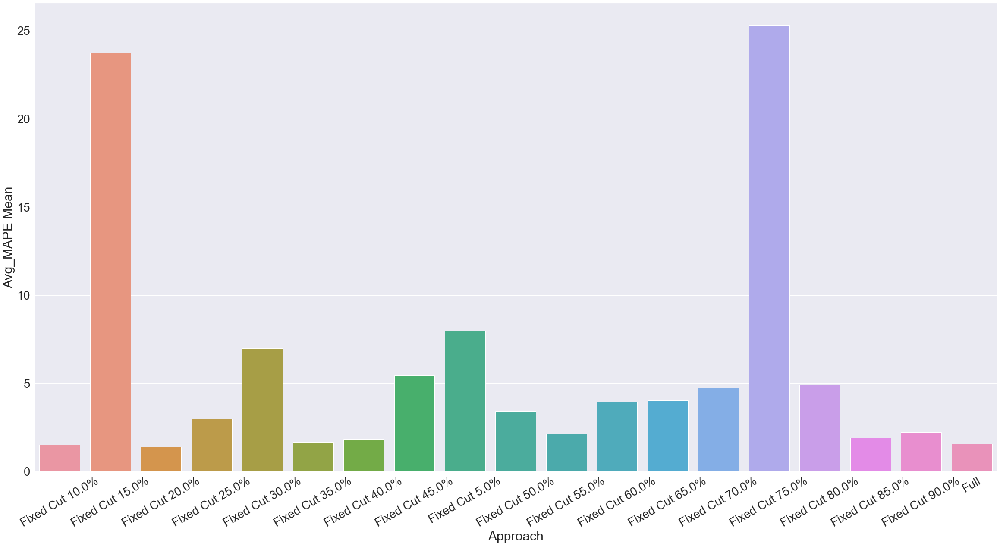

In [39]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

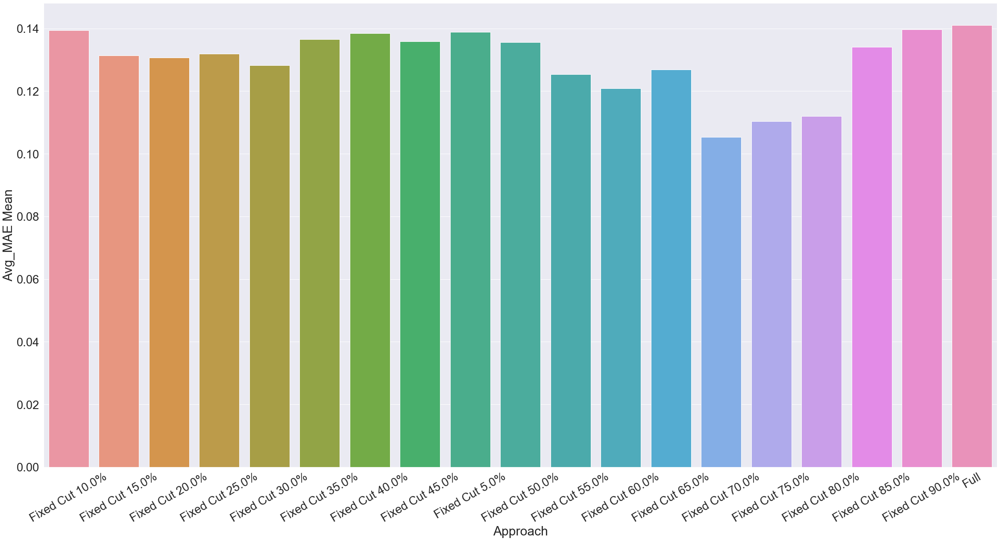

In [40]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

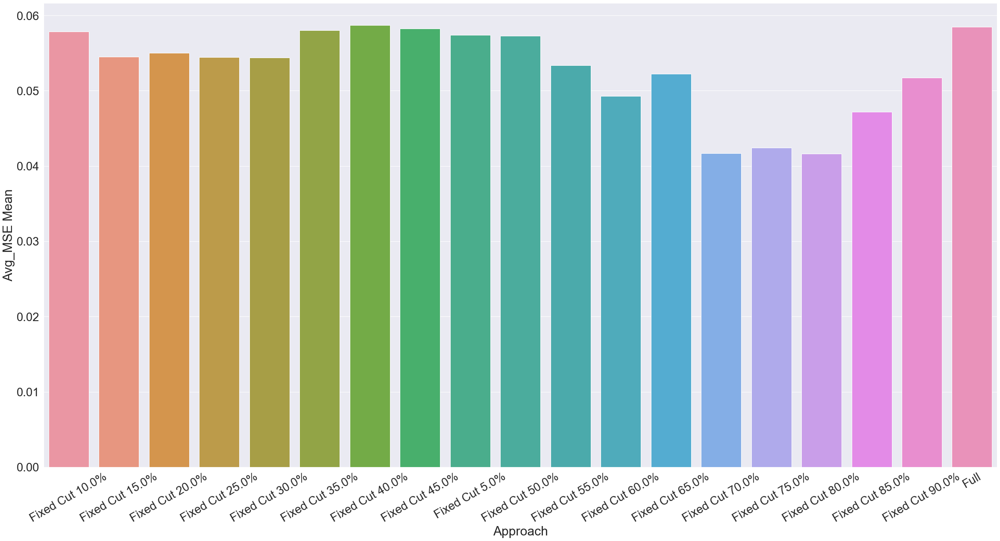

In [41]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

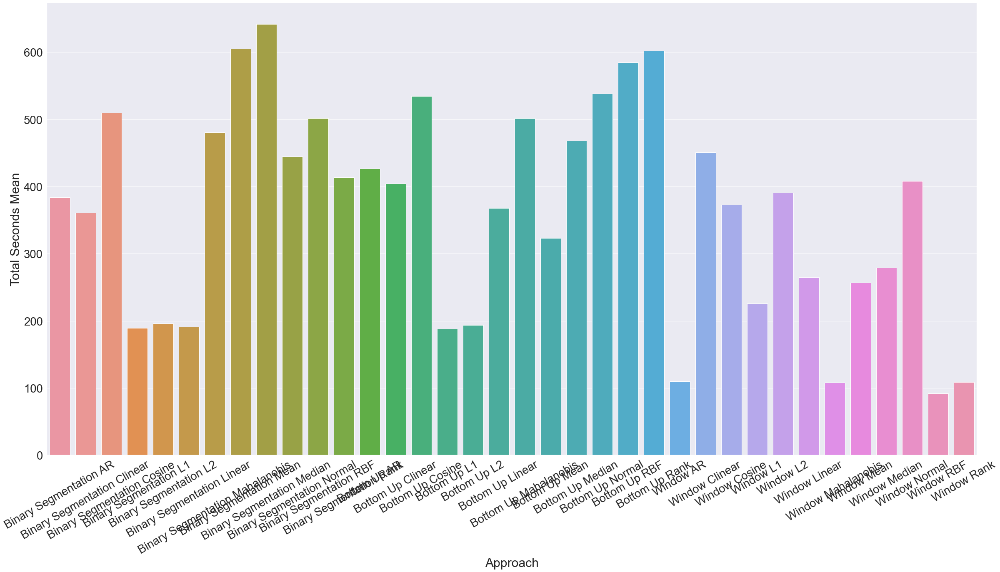

In [42]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

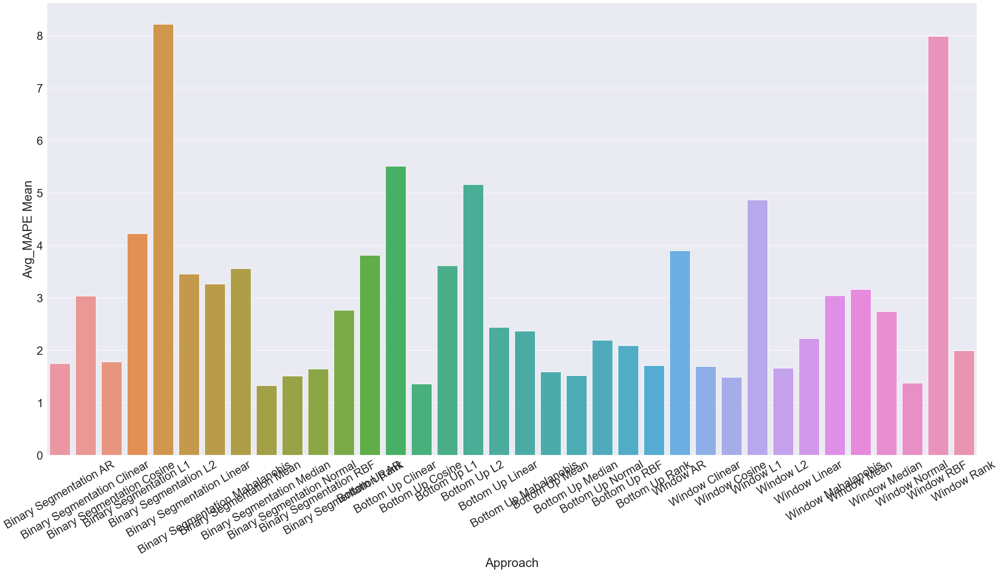

In [43]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

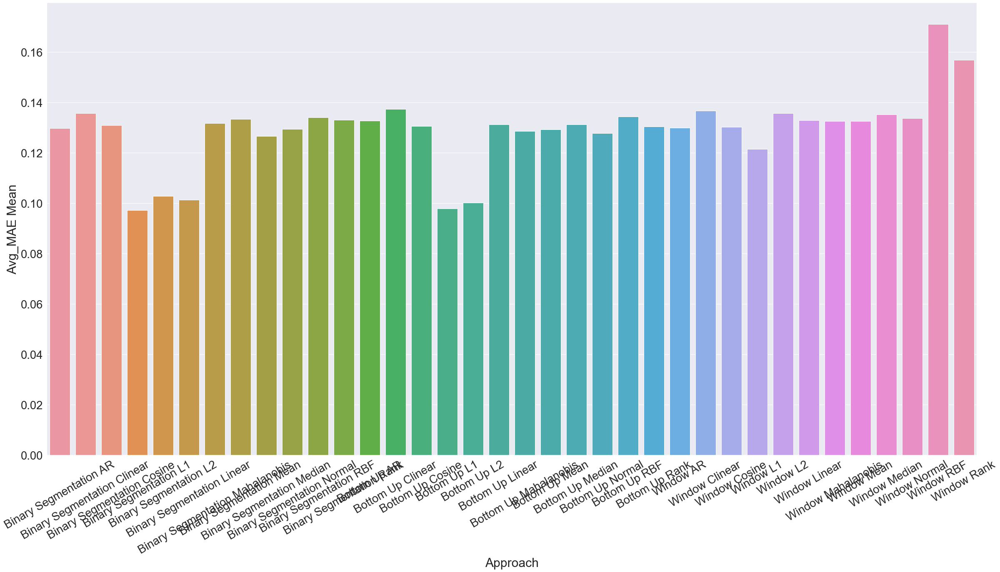

In [44]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

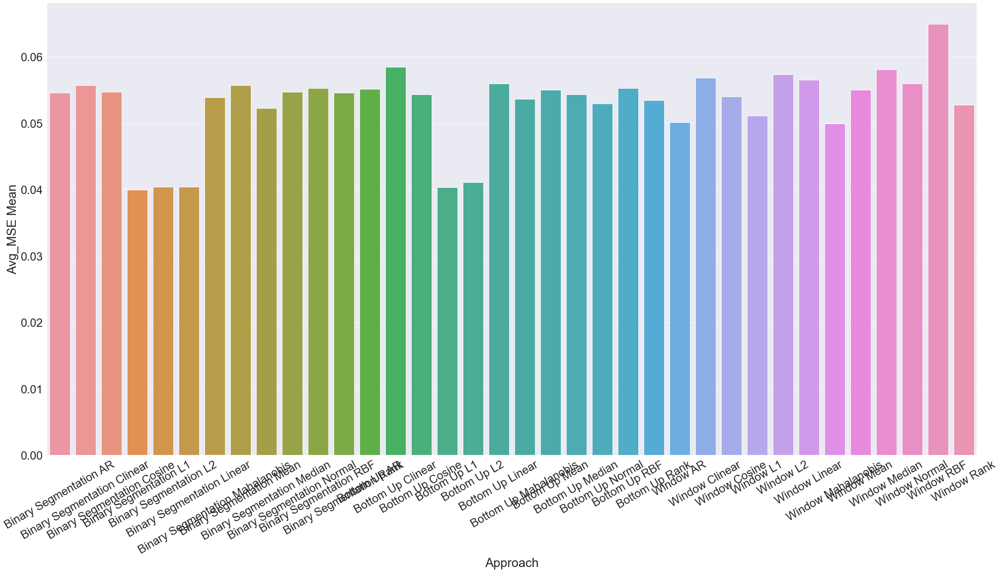

In [45]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [46]:
rank_df = get_rank_df(df)

In [47]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
3,Binary Segmentation L1,0.177349
15,Bottom Up L1,0.197063
5,Binary Segmentation Linear,0.251175
16,Bottom Up L2,0.269666
4,Binary Segmentation L2,0.280978
39,Fixed Cut 80.0%,0.358108
38,Fixed Cut 75.0%,0.411904
37,Fixed Cut 70.0%,0.830905
40,Fixed Cut 85.0%,0.840921
43,Window AR,0.879557


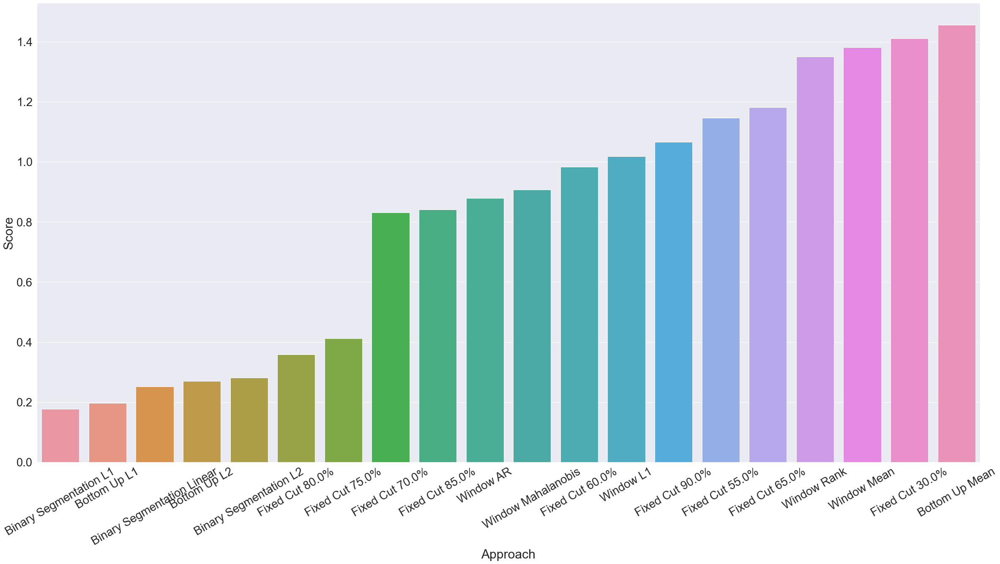

In [48]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [49]:
air_quality_rank_df = rank_df

## INMET - Brasilia

In [50]:
shape = pd.read_csv("datasets/inmet/A533_Brasilia_DF.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 5692 rows and 7 columns


In [51]:
df = get_average_std_df("outputs/INMET/", "BRASILIA_DF")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,P_MAPE Mean,P_MAPE Std,P_MAE Mean,P_MAE Std,P_MSE Mean,P_MSE Std,PrA_MAPE Mean,PrA_MAPE Std,PrA_MAE Mean,PrA_MAE Std,PrA_MSE Mean,PrA_MSE Std,T_MAPE Mean,T_MAPE Std,T_MAE Mean,T_MAE Std,T_MSE Mean,T_MSE Std,UR_MAPE Mean,UR_MAPE Std,UR_MAE Mean,UR_MAE Std,UR_MSE Mean,UR_MSE Std,VV_MAPE Mean,VV_MAPE Std,VV_MAE Mean,VV_MAE Std,VV_MSE Mean,VV_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,153.0,0.0,1139.0,0.0,4400.0,0.0,96.639578,0.0,0.649914,0.111516,85.408451,19.352698,3.015716,0.811702,89.074081,20.271409,13.404924,13.461271,0.076343,0.008712,0.036277,0.001754,0.040992,0.012103,0.042534,0.014298,0.002803,0.002325,0.096146,0.005156,0.073989,0.004852,0.009045,0.001132,0.213192,0.013941,0.148596,0.007812,0.028569,0.002561,0.325513,0.005933,0.140392,0.004861,0.026670,0.001673,2.816153,2.692901,0.096371,0.005267,0.020673,0.001114
1,Binary Segmentation Clinear,183.0,0.0,1139.0,0.0,4370.0,0.0,95.980672,0.0,0.238499,0.023903,82.296856,7.805403,2.834891,0.270382,85.370245,8.063659,5.090107,4.792105,0.086417,0.017313,0.032950,0.004251,0.034950,0.002559,0.034736,0.003291,0.001836,0.000403,0.097161,0.003810,0.072414,0.000888,0.008148,0.000645,0.178636,0.016524,0.128845,0.009712,0.022355,0.002513,0.306223,0.014641,0.124170,0.011090,0.021690,0.003578,1.141416,0.957823,0.089316,0.005599,0.017396,0.001336
2,Binary Segmentation Cosine,153.0,0.0,1139.0,0.0,4400.0,0.0,96.639578,0.0,24.760507,1.029080,81.620320,8.324530,2.520885,0.311404,108.901712,9.499084,15.916581,11.034740,0.073615,0.001763,0.036673,0.002270,0.043310,0.013213,0.045021,0.014995,0.002977,0.001763,0.127668,0.050586,0.107917,0.054157,0.018838,0.016732,0.208204,0.063043,0.144776,0.036319,0.028415,0.010676,0.336501,0.033848,0.147048,0.035897,0.030357,0.011751,3.326453,2.203457,0.103675,0.007963,0.023452,0.002442
3,Binary Segmentation L1,153.0,0.0,1139.0,0.0,4400.0,0.0,96.639578,0.0,0.747553,0.076508,80.243692,7.426585,2.647787,0.382192,83.639033,7.856054,7.238279,4.835247,0.078926,0.005324,0.035395,0.001369,0.038559,0.013014,0.037796,0.013402,0.002372,0.001501,0.105084,0.024130,0.083360,0.024434,0.011335,0.006138,0.260128,0.039429,0.173049,0.020389,0.037640,0.007781,0.342319,0.029687,0.154638,0.026907,0.032693,0.010174,1.596874,0.955169,0.105554,0.012911,0.023887,0.003688
4,Binary Segmentation L2,153.0,0.0,1139.0,0.0,4400.0,0.0,96.639578,0.0,0.215769,0.020847,84.091248,14.110339,2.586575,0.319682,86.893592,14.369745,10.274063,16.113858,0.075786,0.008618,0.034370,0.001486,0.033516,0.012988,0.034339,0.014212,0.001892,0.001603,0.108756,0.015683,0.087343,0.015625,0.012306,0.003733,0.191883,0.041090,0.135944,0.023113,0.024751,0.007668,0.332013,0.024709,0.146223,0.021495,0.029309,0.007138,2.188046,3.214858,0.095927,0.008411,0.020526,0.001938


### Fixed cuts

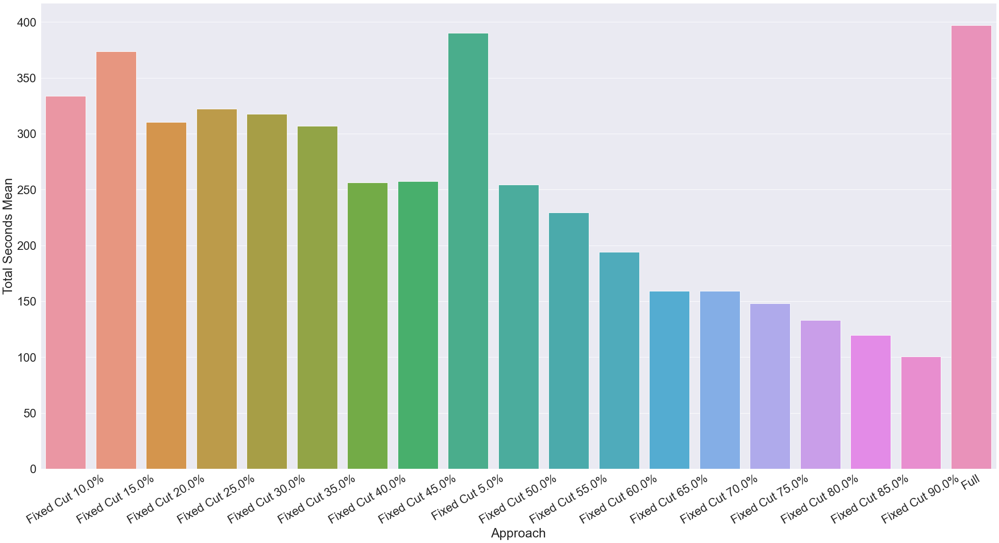

In [52]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

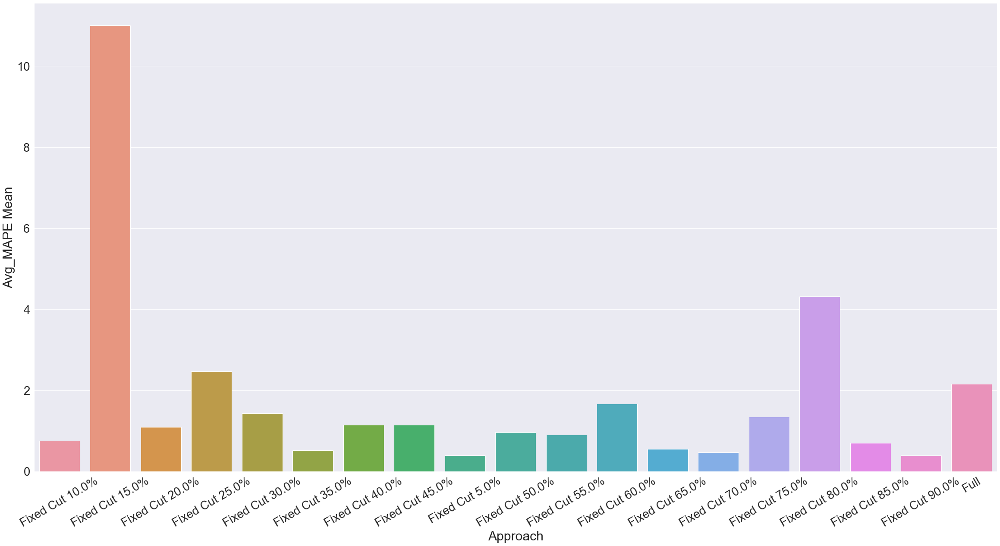

In [53]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

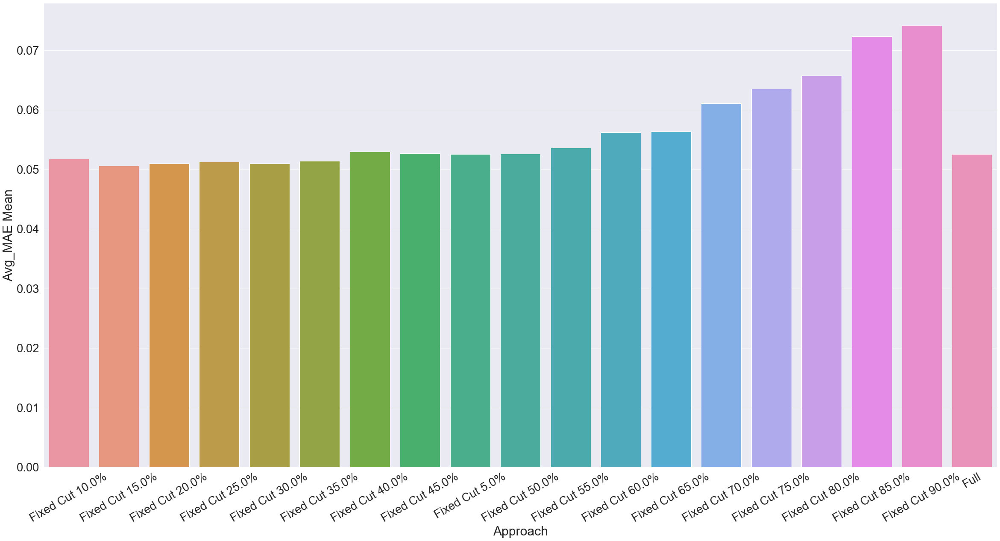

In [54]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

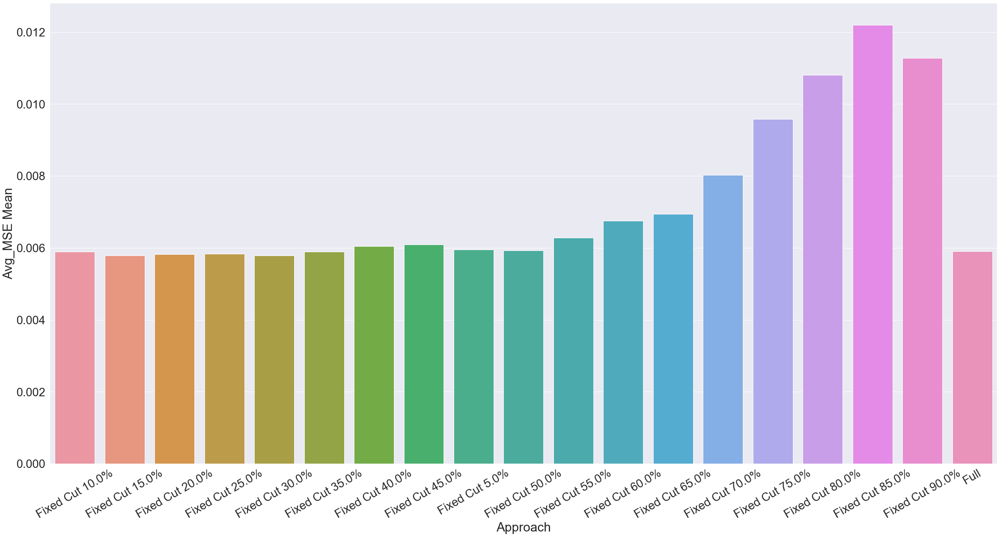

In [55]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

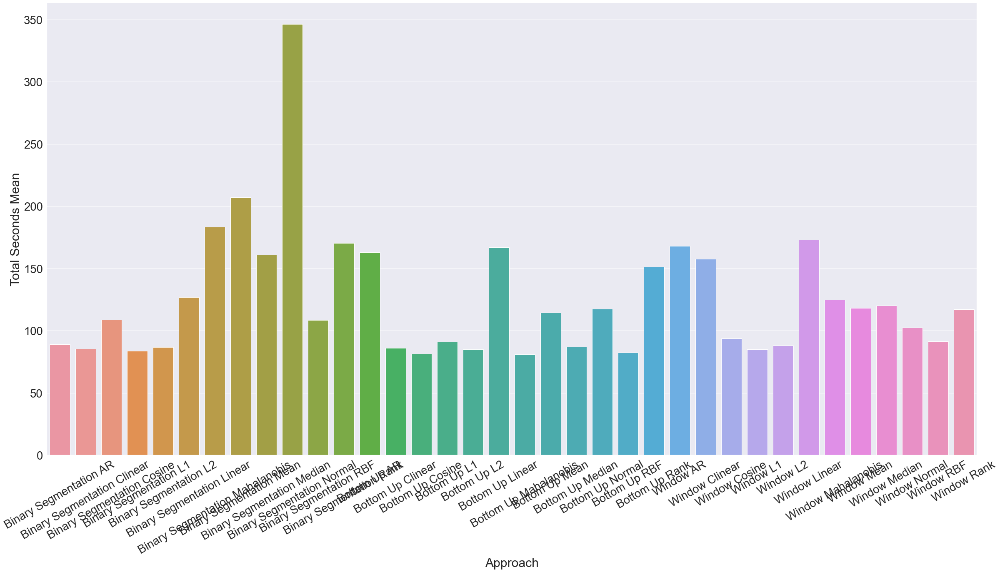

In [56]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

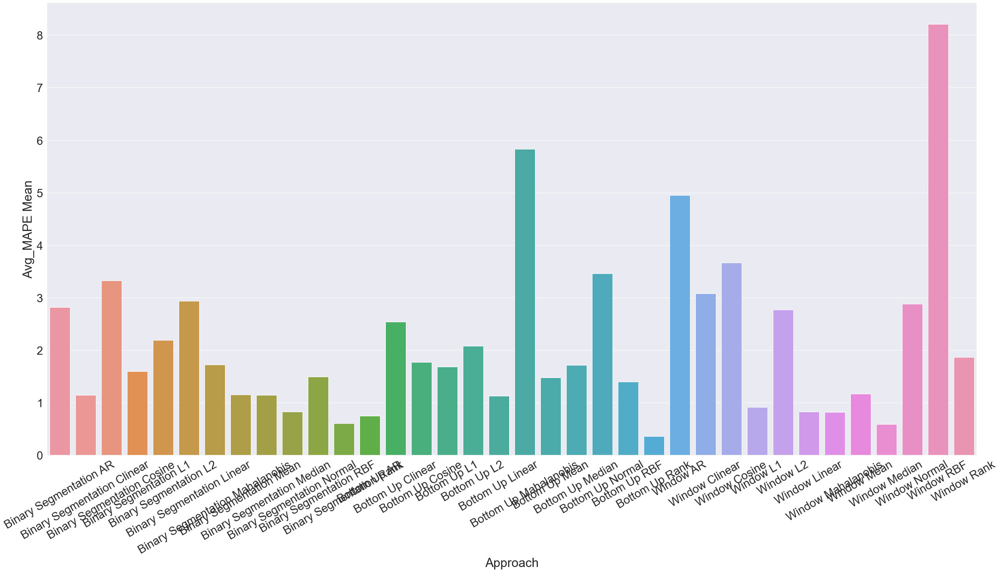

In [57]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

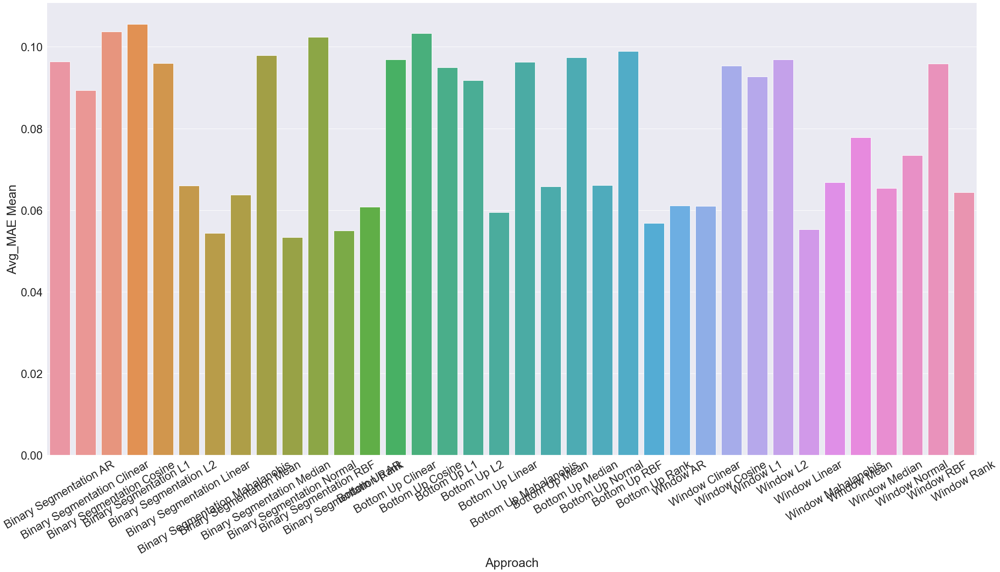

In [58]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

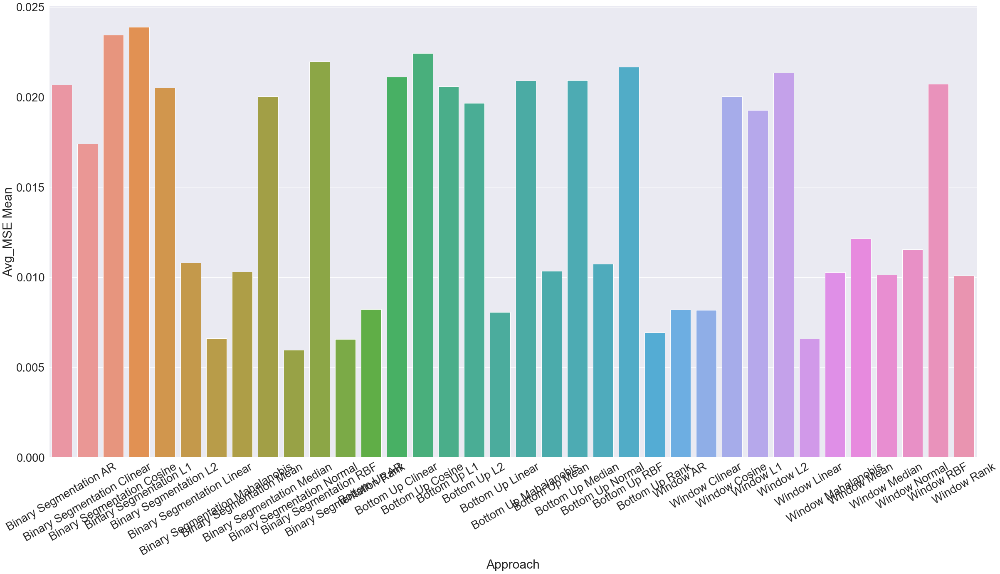

In [59]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [60]:
rank_df = get_rank_df(df)

In [61]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
23,Bottom Up Rank,0.398768
11,Binary Segmentation Rank,0.404580
36,Fixed Cut 65.0%,0.415679
48,Window Linear,0.420810
6,Binary Segmentation Mahalanobis,0.438100
35,Fixed Cut 60.0%,0.512136
34,Fixed Cut 55.0%,0.551225
17,Bottom Up Linear,0.558839
37,Fixed Cut 70.0%,0.561447
44,Window Clinear,0.562294


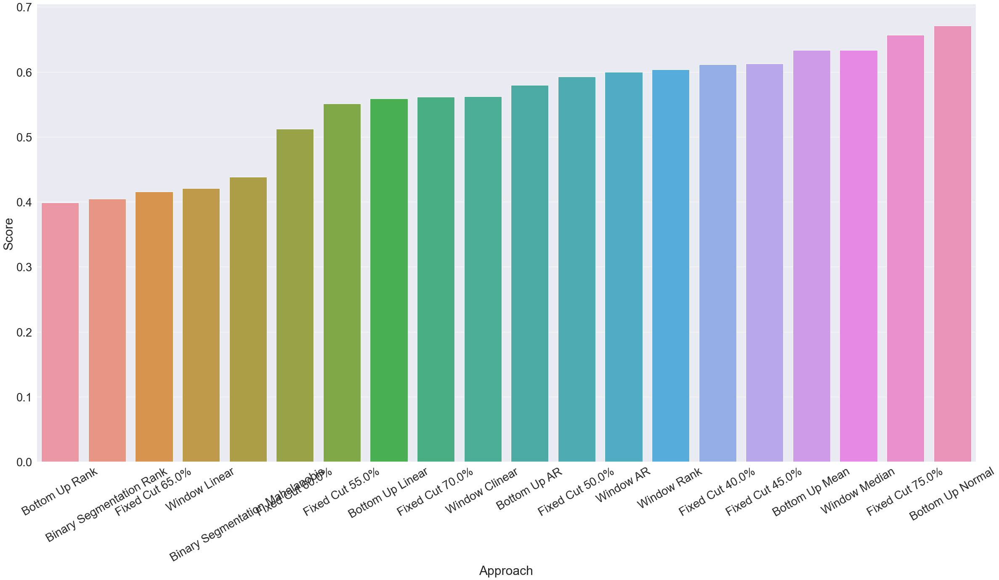

In [62]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [63]:
brasilia_rank_df = rank_df

## INMET - Cristalina

In [64]:
shape = pd.read_csv("datasets/inmet/A036_Cristalina_GO.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 5495 rows and 7 columns


In [65]:
df = get_average_std_df("outputs/INMET/", "CRISTALINA_GO")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,P_MAPE Mean,P_MAPE Std,P_MAE Mean,P_MAE Std,P_MSE Mean,P_MSE Std,PrA_MAPE Mean,PrA_MAPE Std,PrA_MAE Mean,PrA_MAE Std,PrA_MSE Mean,PrA_MSE Std,T_MAPE Mean,T_MAPE Std,T_MAE Mean,T_MAE Std,T_MSE Mean,T_MSE Std,UR_MAPE Mean,UR_MAPE Std,UR_MAE Mean,UR_MAE Std,UR_MSE Mean,UR_MSE Std,VV_MAPE Mean,VV_MAPE Std,VV_MAE Mean,VV_MAE Std,VV_MSE Mean,VV_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,2011.0,0.0,1099.0,0.0,2385.0,0.0,54.253867,0.0,0.519383,0.038063,218.781930,52.864416,10.651514,7.245572,229.952827,59.383085,2.076504,0.818355,0.064331,0.006548,0.015972,0.000518,0.014717,0.006489,0.014382,0.006233,0.000350,0.000289,0.080587,0.002623,0.058562,0.002212,0.005812,0.000408,0.207905,0.006319,0.139183,0.004337,0.028800,0.001765,0.627899,0.055147,0.077398,0.000869,0.007909,0.000499,0.601522,0.164727,0.070771,0.001245,0.011769,0.000473
1,Binary Segmentation Clinear,2281.0,0.0,1099.0,0.0,2115.0,0.0,48.111920,0.0,0.204362,0.023143,228.201926,53.916541,9.713229,2.325296,238.119517,52.370967,1.812058,0.363236,0.063285,0.007215,0.015781,0.000238,0.015093,0.005259,0.014800,0.005050,0.000322,0.000222,0.083385,0.003357,0.061018,0.002780,0.006336,0.000595,0.205066,0.007501,0.137048,0.004136,0.027913,0.001909,0.648024,0.118075,0.078723,0.004556,0.008208,0.000763,0.552725,0.071696,0.070975,0.002149,0.011712,0.000625
2,Binary Segmentation Cosine,2071.0,0.0,1099.0,0.0,2325.0,0.0,52.888990,0.0,15.705499,0.833974,229.859796,29.288439,10.449216,4.410229,256.014512,32.990270,2.777358,1.804847,0.063112,0.008189,0.016247,0.000766,0.009144,0.005649,0.009036,0.005566,0.000154,0.000159,0.083419,0.004475,0.060834,0.002854,0.006321,0.000685,0.211587,0.013713,0.139352,0.004989,0.028658,0.001957,0.753814,0.203809,0.082836,0.006900,0.008752,0.001190,0.767065,0.360870,0.071034,0.003164,0.012026,0.000638
3,Binary Segmentation L1,686.0,0.0,1099.0,0.0,3710.0,0.0,84.394904,0.0,0.631855,0.060418,105.778743,9.828741,3.610849,0.816340,110.021447,10.185237,2.521672,1.743279,0.125322,0.078618,0.037503,0.031924,0.688467,0.614465,0.283274,0.113559,0.132442,0.098736,9.930393,15.498892,0.329048,0.204783,0.199909,0.216199,0.629785,0.388578,0.232380,0.071278,0.081008,0.044161,223.649715,303.686855,2.085554,0.072256,6.659474,0.448728,47.484007,61.251715,0.611116,0.077759,1.422067,0.144183
4,Binary Segmentation L2,2071.0,0.0,1099.0,0.0,2325.0,0.0,52.888990,0.0,0.184596,0.017376,212.823185,12.864854,11.238066,6.970840,224.245847,17.393204,1.607094,0.394583,0.071947,0.010622,0.015890,0.000387,0.012148,0.007640,0.012130,0.007774,0.000263,0.000280,0.082102,0.000327,0.060134,0.000496,0.006117,0.000101,0.207589,0.017378,0.139036,0.006782,0.028661,0.002653,0.640065,0.079187,0.078453,0.005009,0.008065,0.000629,0.509800,0.090690,0.072340,0.004291,0.011799,0.000746


### Fixed cuts

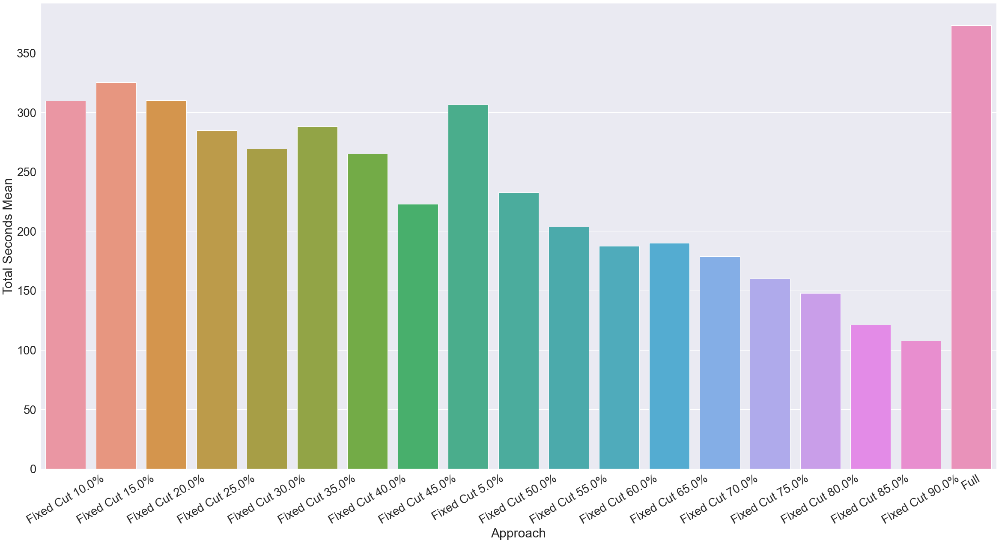

In [66]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

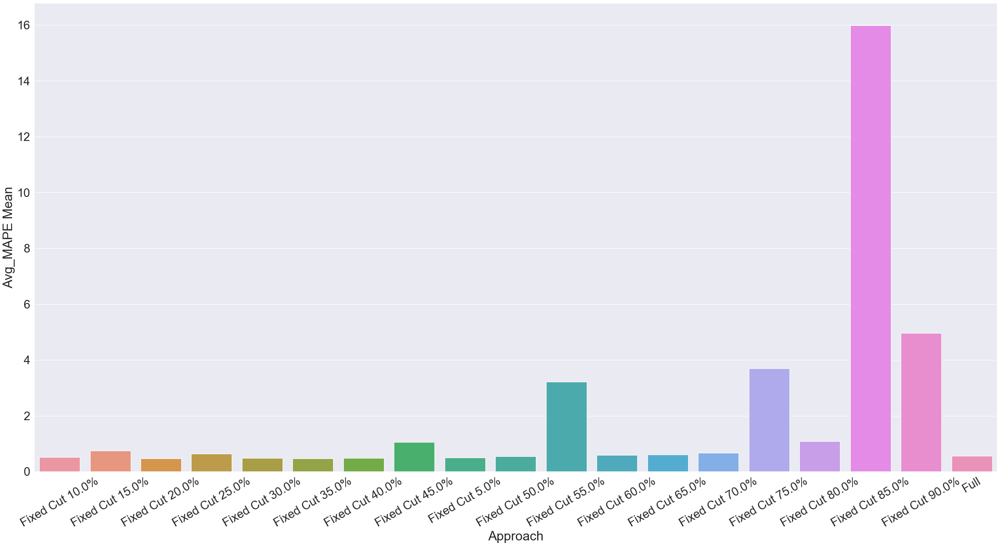

In [67]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

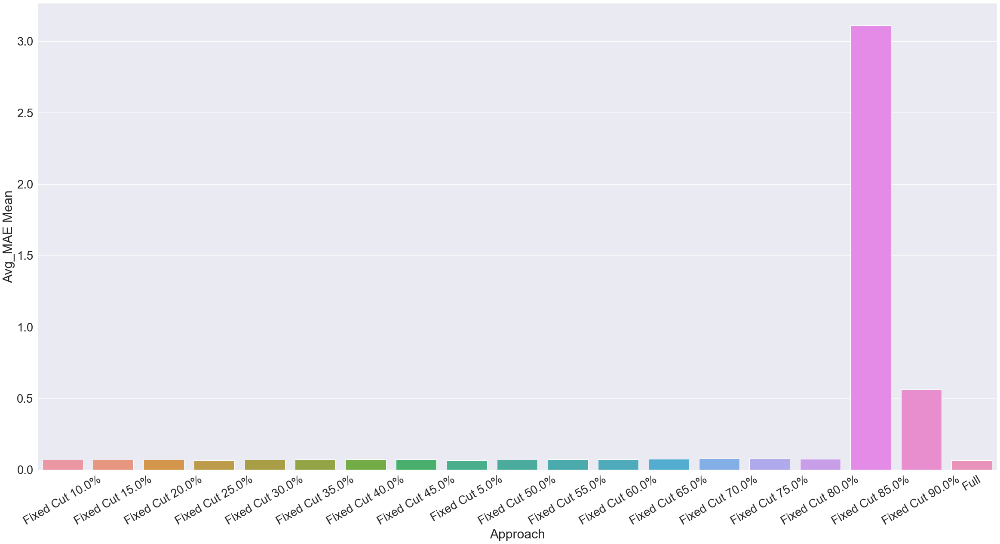

In [68]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

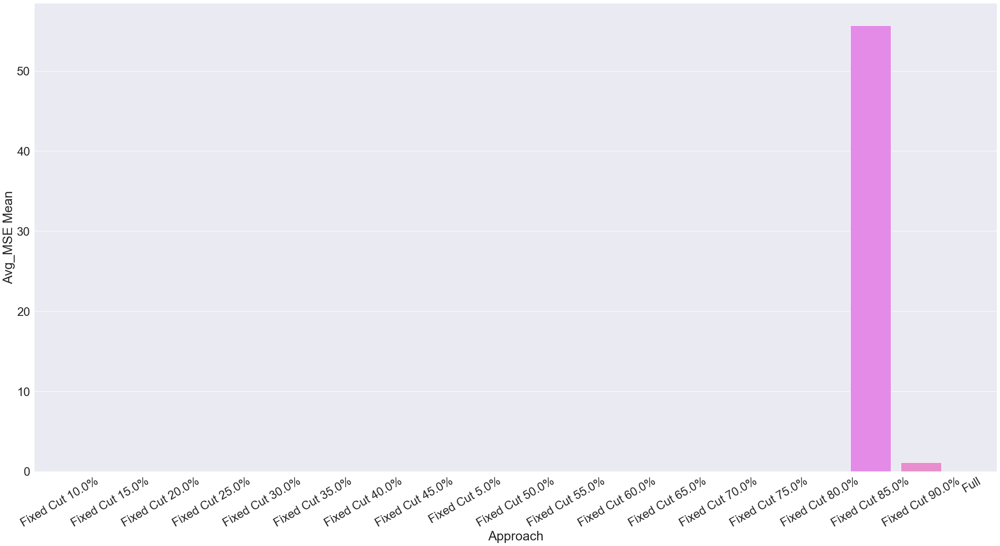

In [69]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

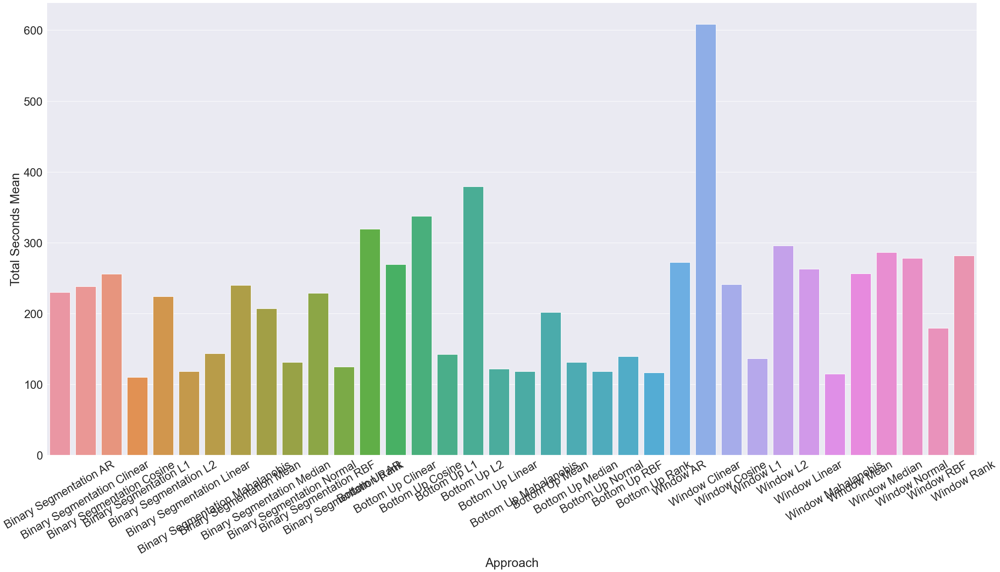

In [70]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

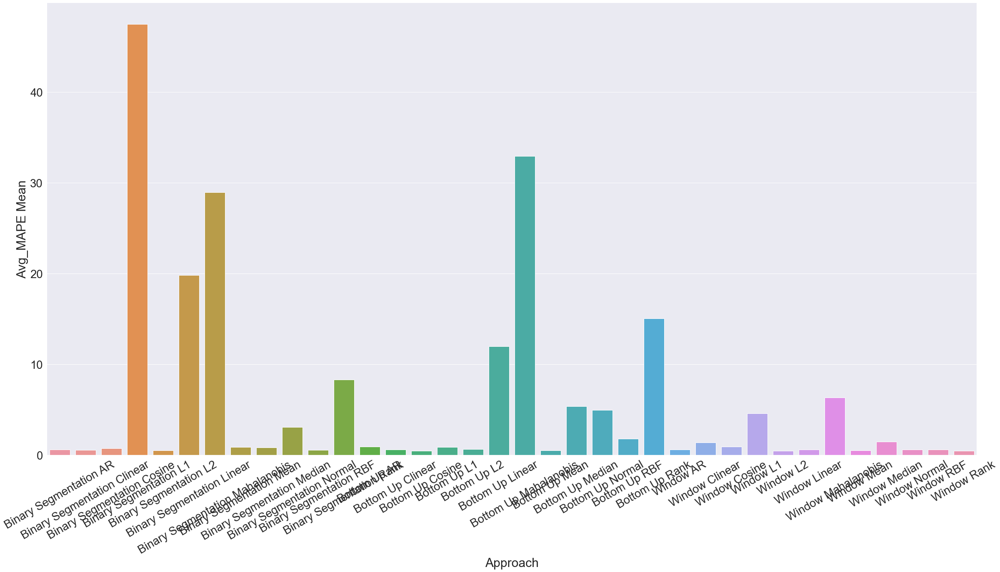

In [71]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

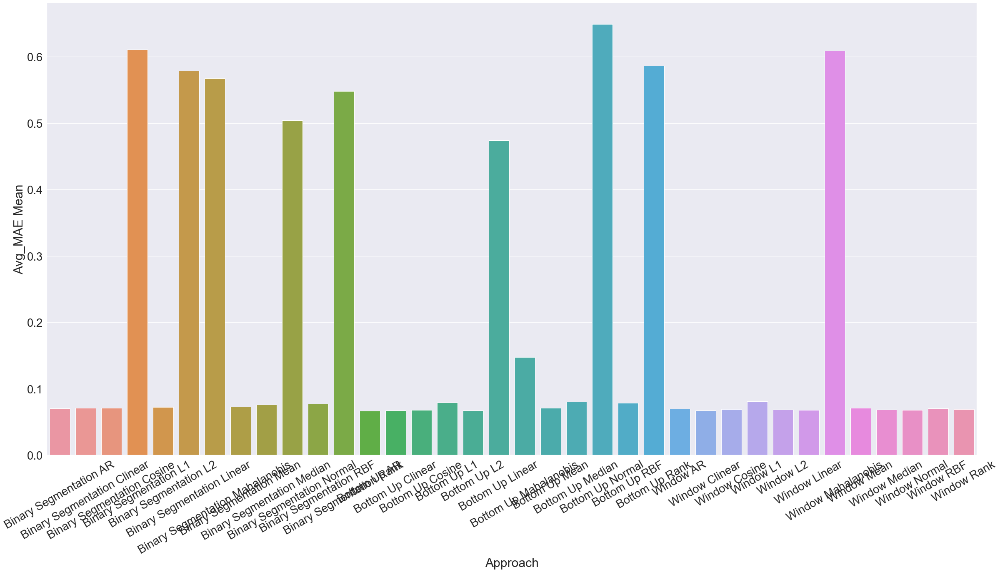

In [72]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

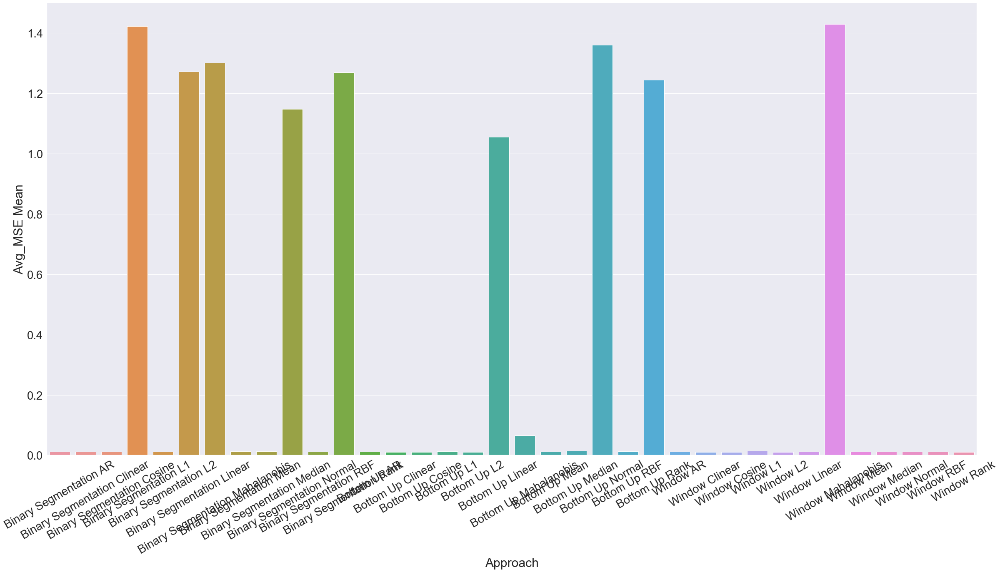

In [73]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [74]:
rank_df = get_rank_df(df)

In [75]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
18,Bottom Up Mahalanobis,0.048826
20,Bottom Up Median,0.051322
46,Window L1,0.061847
22,Bottom Up RBF,0.067218
15,Bottom Up L1,0.073674
39,Fixed Cut 80.0%,0.083604
38,Fixed Cut 75.0%,0.108182
53,Window RBF,0.144175
37,Fixed Cut 70.0%,0.145421
35,Fixed Cut 60.0%,0.161571


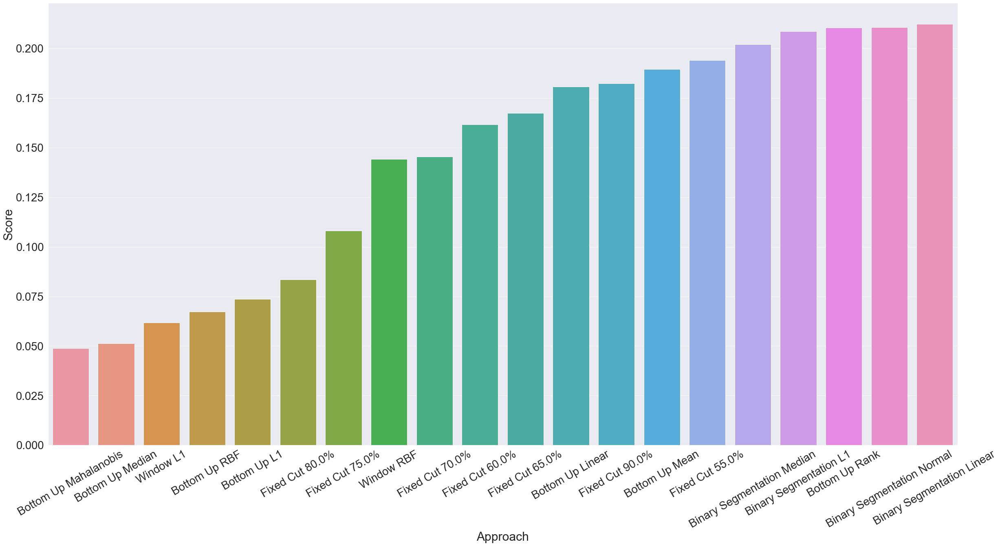

In [76]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [77]:
cristalina_rank_df = rank_df

## INMET - Ibirite

In [78]:
shape = pd.read_csv("datasets/inmet/A555_Ibirite_MG.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 5322 rows and 7 columns


In [79]:
df = get_average_std_df("outputs/INMET/", "IBIRITE_MG")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,P_MAPE Mean,P_MAPE Std,P_MAE Mean,P_MAE Std,P_MSE Mean,P_MSE Std,PrA_MAPE Mean,PrA_MAPE Std,PrA_MAE Mean,PrA_MAE Std,PrA_MSE Mean,PrA_MSE Std,T_MAPE Mean,T_MAPE Std,T_MAE Mean,T_MAE Std,T_MSE Mean,T_MSE Std,UR_MAPE Mean,UR_MAPE Std,UR_MAE Mean,UR_MAE Std,UR_MSE Mean,UR_MSE Std,VV_MAPE Mean,VV_MAPE Std,VV_MAE Mean,VV_MAE Std,VV_MSE Mean,VV_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,17.0,0.0,1065.0,0.0,4240.0,0.0,99.600658,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Binary Segmentation Clinear,4122.0,0.0,1065.0,0.0,135.0,0.0,3.171247,0.0,0.241849,0.028530,282.380188,21.925569,16.298060,6.102477,298.920097,27.020014,1.638389,0.657546,0.036340,0.005274,0.004946,0.000114,0.008872,0.004113,0.008772,0.004083,0.000133,0.000112,0.090433,0.002045,0.064602,0.001621,0.00677,0.000324,0.129376,0.001544,0.090317,0.000957,0.013261,0.000295,0.380788,0.002341,0.149479,0.001151,0.033580,0.000551,0.449572,0.130636,0.069902,0.001595,0.011738,0.000152
2,Binary Segmentation Cosine,17.0,0.0,1065.0,0.0,4240.0,0.0,99.600658,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Binary Segmentation L1,4157.0,0.0,1065.0,0.0,100.0,0.0,2.349072,0.0,0.651637,0.070468,292.658851,33.525444,14.455343,7.680018,307.765831,38.131591,1.531086,0.197250,0.035842,0.001737,0.004916,0.000119,0.010189,0.004347,0.009983,0.004165,0.000182,0.000176,0.091103,0.002150,0.064703,0.001484,0.00676,0.000347,0.130900,0.003849,0.092153,0.002429,0.013924,0.000731,0.381973,0.001867,0.149604,0.002072,0.033622,0.000963,0.429050,0.040911,0.070457,0.001775,0.011881,0.000331
4,Binary Segmentation L2,17.0,0.0,1065.0,0.0,4240.0,0.0,99.600658,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Fixed cuts

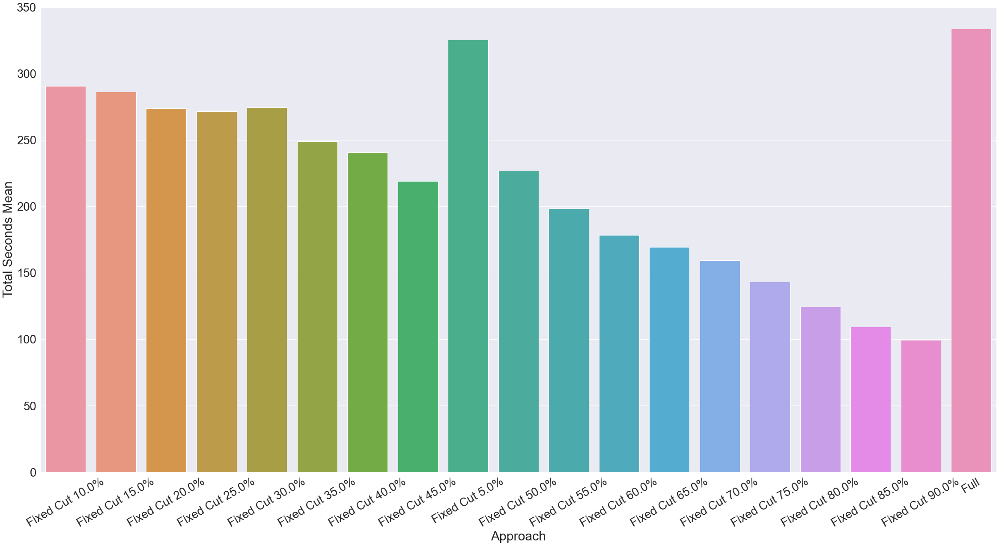

In [80]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

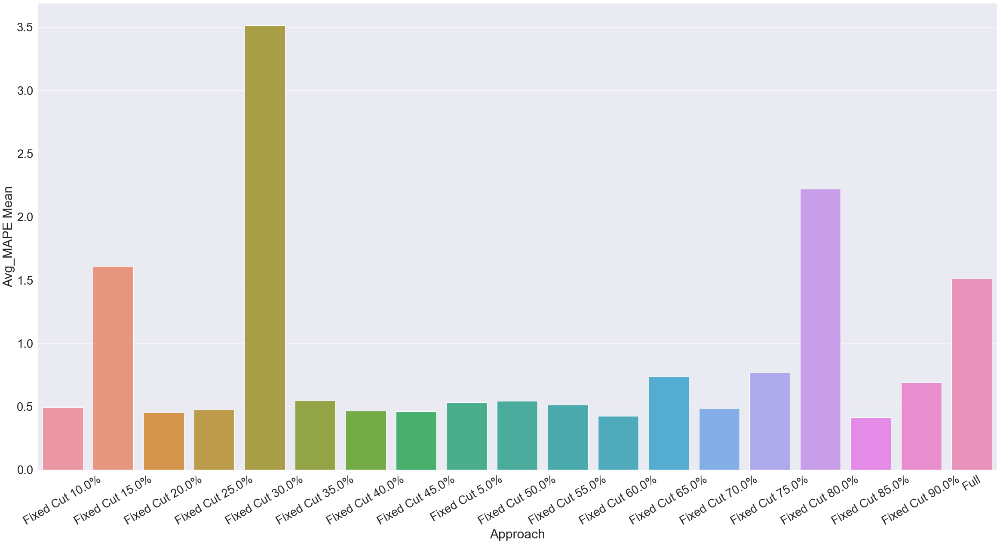

In [81]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

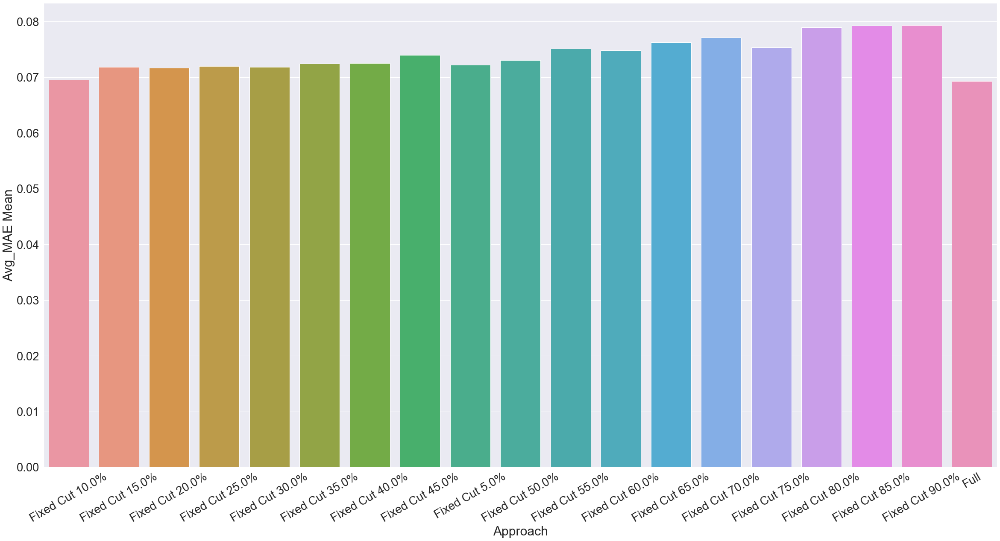

In [82]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

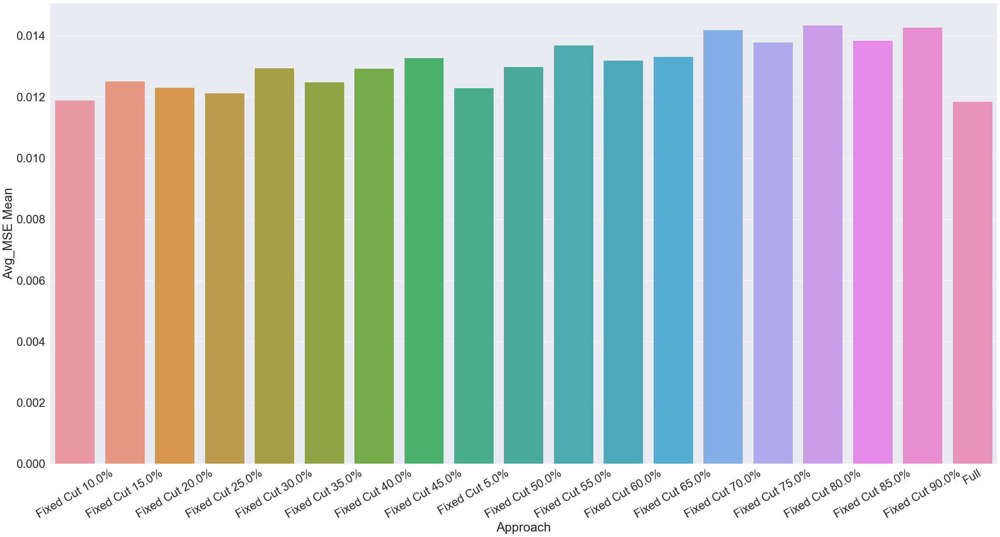

In [83]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

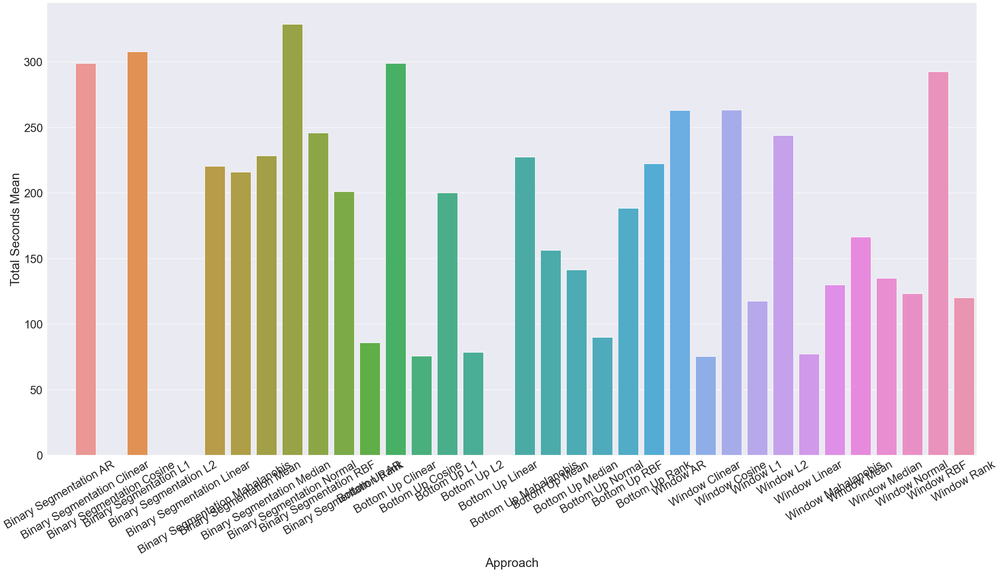

In [84]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

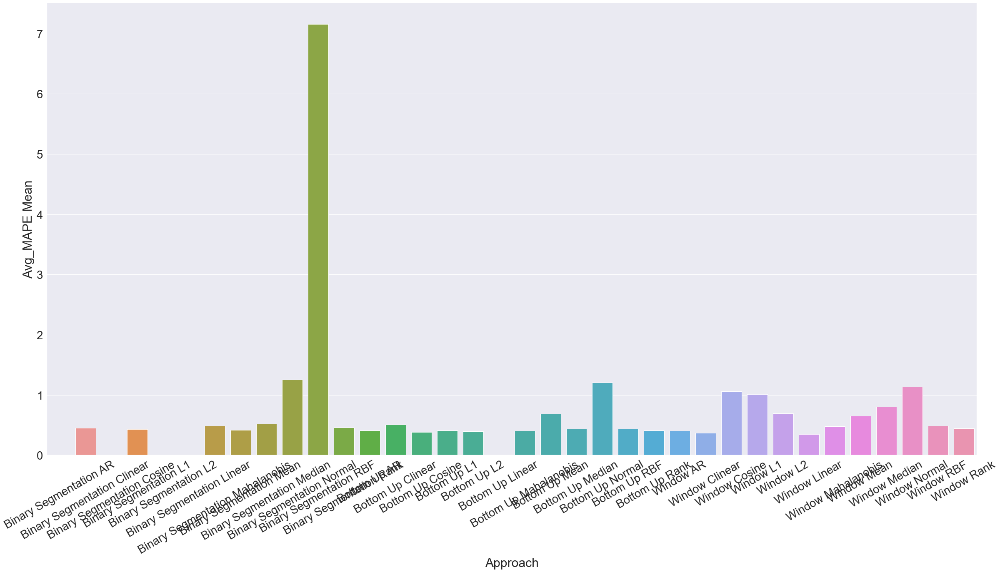

In [85]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

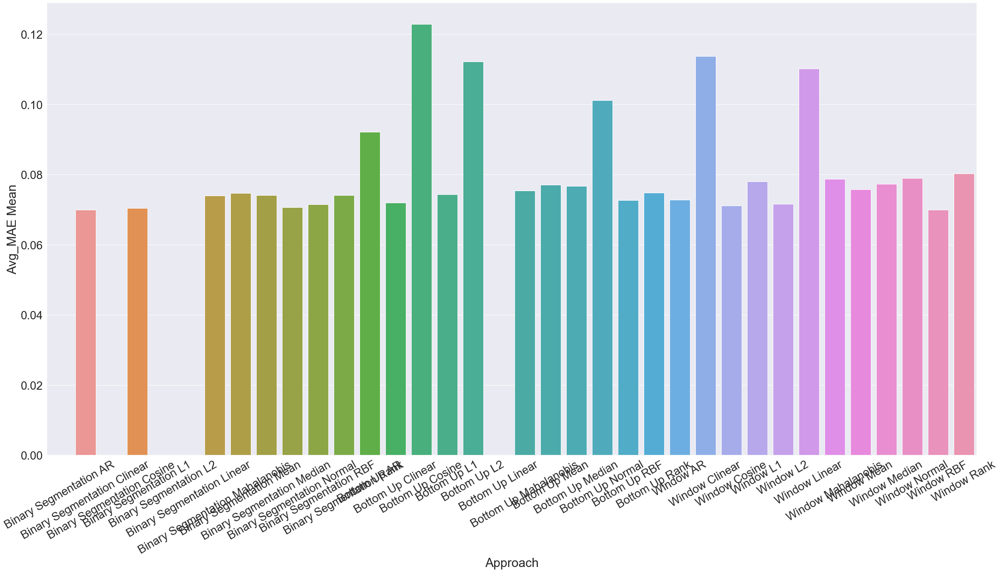

In [86]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

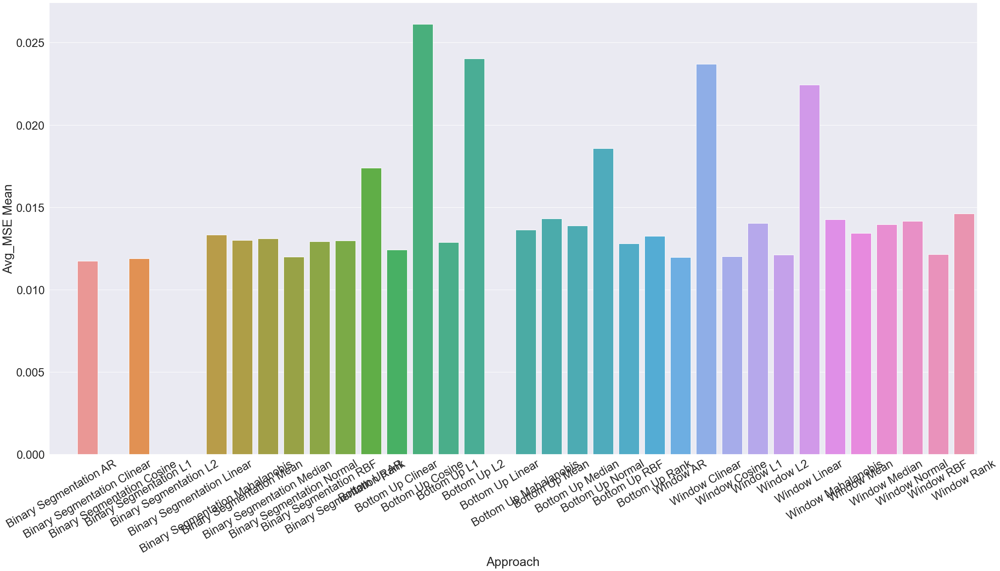

In [87]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [88]:
rank_df = get_rank_df(df)

In [89]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
41,Fixed Cut 90.0%,0.457424
40,Fixed Cut 85.0%,0.464843
46,Window L1,0.483739
38,Fixed Cut 75.0%,0.518093
52,Window Normal,0.533227
51,Window Median,0.534812
20,Bottom Up Median,0.543356
39,Fixed Cut 80.0%,0.551963
49,Window Mahalanobis,0.561778
22,Bottom Up RBF,0.573281


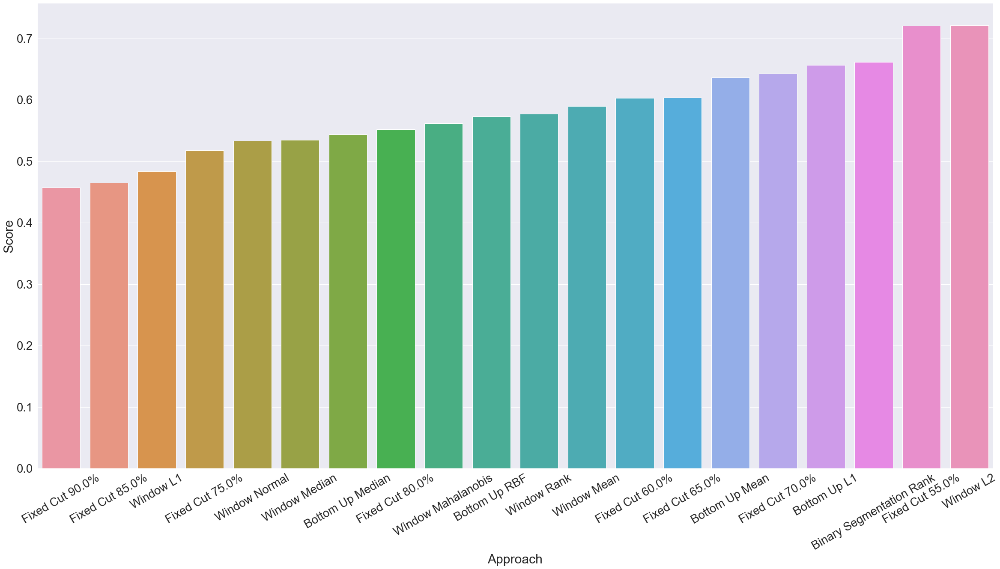

In [90]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [91]:
ibirite_rank_df = rank_df

## Apple Stocks

In [92]:
shape = pd.read_csv("datasets/tcpd/apple.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 622 rows and 4 columns


In [93]:
df = get_average_std_df("outputs/TCPD/", "APPLE")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,Close_MAPE Mean,Close_MAPE Std,Close_MAE Mean,Close_MAE Std,Close_MSE Mean,Close_MSE Std,Volume_MAPE Mean,Volume_MAPE Std,Volume_MAE Mean,Volume_MAE Std,Volume_MSE Mean,Volume_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,317.0,0.0,125.0,0.0,180.0,0.0,36.217304,0.0,0.020301,0.002184,86.647255,5.705253,3.025891,0.325682,89.693447,5.657820,0.126942,0.023281,0.036461,0.006490,0.002002,0.000622,3.901169,7.619545,0.024765,0.007079,0.001273,0.000465,2.014056,3.798975,0.030613,0.002468,0.001638,0.000136
1,Binary Segmentation Clinear,337.0,0.0,125.0,0.0,160.0,0.0,32.193159,0.0,0.009347,0.001485,82.923293,9.097453,2.668102,0.336673,85.600743,9.301468,0.119096,0.024549,0.033197,0.005449,0.001658,0.000512,1.112708,1.356346,0.031454,0.019264,0.001926,0.001723,0.615902,0.682476,0.032326,0.010709,0.001792,0.000961
2,Binary Segmentation Cosine,22.0,0.0,125.0,0.0,475.0,0.0,95.573441,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Binary Segmentation L1,412.0,0.0,125.0,0.0,85.0,0.0,17.102616,0.0,0.028433,0.004091,93.181113,4.637316,2.959473,0.667008,96.169019,4.509282,0.118850,0.022020,0.033845,0.005554,0.001720,0.000481,0.469742,0.039799,0.027352,0.006662,0.001218,0.000357,0.294296,0.026969,0.030599,0.005268,0.001469,0.000370
4,Binary Segmentation L2,452.0,0.0,125.0,0.0,45.0,0.0,9.054326,0.0,0.015312,0.000465,92.483099,8.440408,2.991467,0.172643,95.489878,8.406844,0.135942,0.029763,0.037207,0.006847,0.001988,0.000607,0.550016,0.263681,0.021448,0.000642,0.001027,0.000145,0.342979,0.135299,0.029327,0.003593,0.001508,0.000317


In [94]:
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,Close_MAPE Mean,Close_MAPE Std,Close_MAE Mean,Close_MAE Std,Close_MSE Mean,Close_MSE Std,Volume_MAPE Mean,Volume_MAPE Std,Volume_MAE Mean,Volume_MAE Std,Volume_MSE Mean,Volume_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,317.0,0.0,125.0,0.0,180.0,0.0,36.217304,0.0,0.020301,0.002184,86.647255,5.705253,3.025891,0.325682,89.693447,5.657820,0.126942,0.023281,0.036461,0.006490,0.002002,0.000622,3.901169,7.619545,0.024765,0.007079,0.001273,0.000465,2.014056,3.798975,0.030613,0.002468,0.001638,0.000136
1,Binary Segmentation Clinear,337.0,0.0,125.0,0.0,160.0,0.0,32.193159,0.0,0.009347,0.001485,82.923293,9.097453,2.668102,0.336673,85.600743,9.301468,0.119096,0.024549,0.033197,0.005449,0.001658,0.000512,1.112708,1.356346,0.031454,0.019264,0.001926,0.001723,0.615902,0.682476,0.032326,0.010709,0.001792,0.000961
2,Binary Segmentation Cosine,22.0,0.0,125.0,0.0,475.0,0.0,95.573441,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Binary Segmentation L1,412.0,0.0,125.0,0.0,85.0,0.0,17.102616,0.0,0.028433,0.004091,93.181113,4.637316,2.959473,0.667008,96.169019,4.509282,0.118850,0.022020,0.033845,0.005554,0.001720,0.000481,0.469742,0.039799,0.027352,0.006662,0.001218,0.000357,0.294296,0.026969,0.030599,0.005268,0.001469,0.000370
4,Binary Segmentation L2,452.0,0.0,125.0,0.0,45.0,0.0,9.054326,0.0,0.015312,0.000465,92.483099,8.440408,2.991467,0.172643,95.489878,8.406844,0.135942,0.029763,0.037207,0.006847,0.001988,0.000607,0.550016,0.263681,0.021448,0.000642,0.001027,0.000145,0.342979,0.135299,0.029327,0.003593,0.001508,0.000317


### Fixed cuts

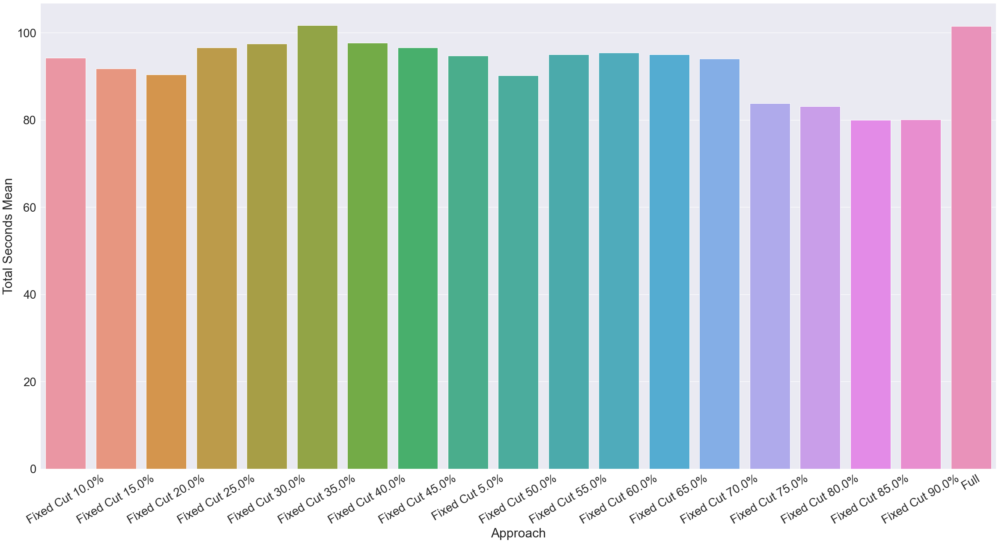

In [95]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

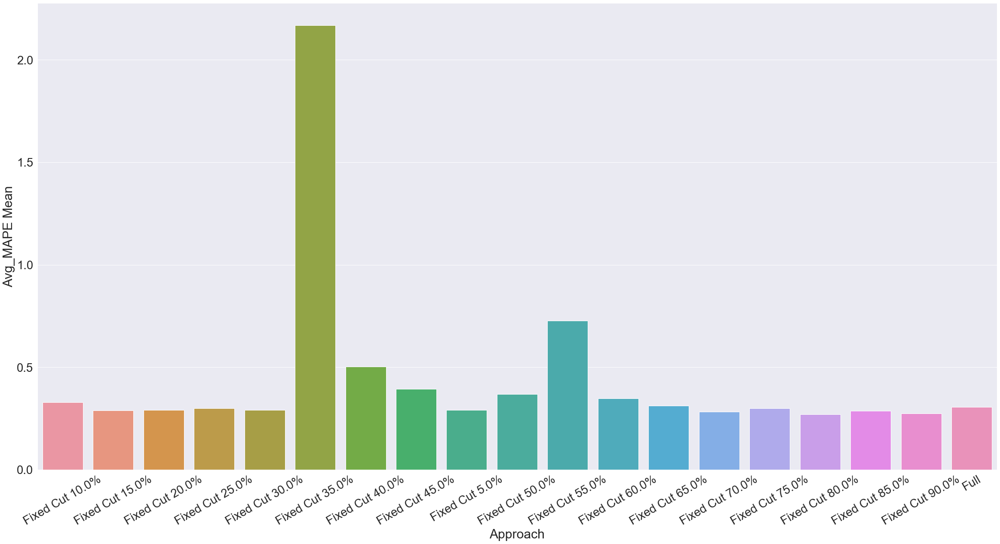

In [96]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

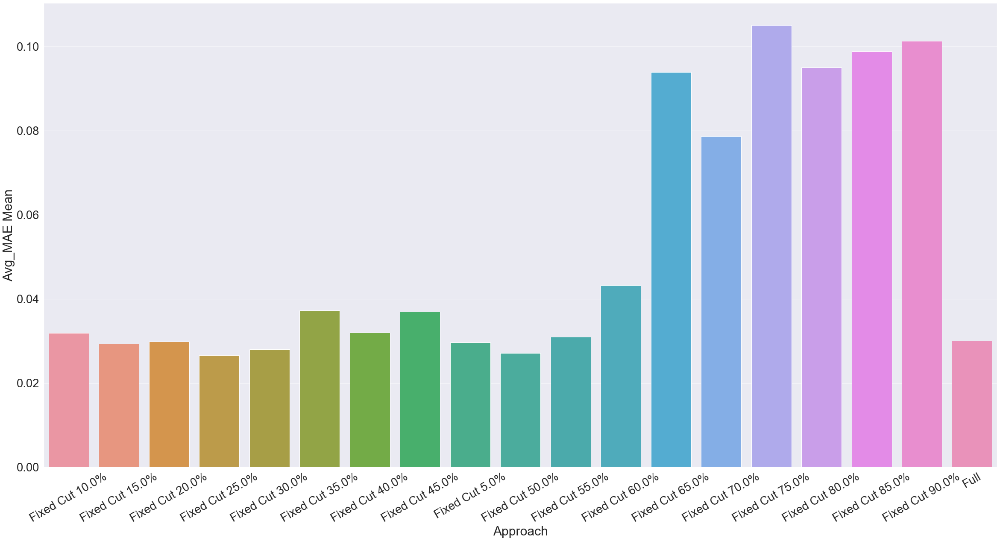

In [97]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

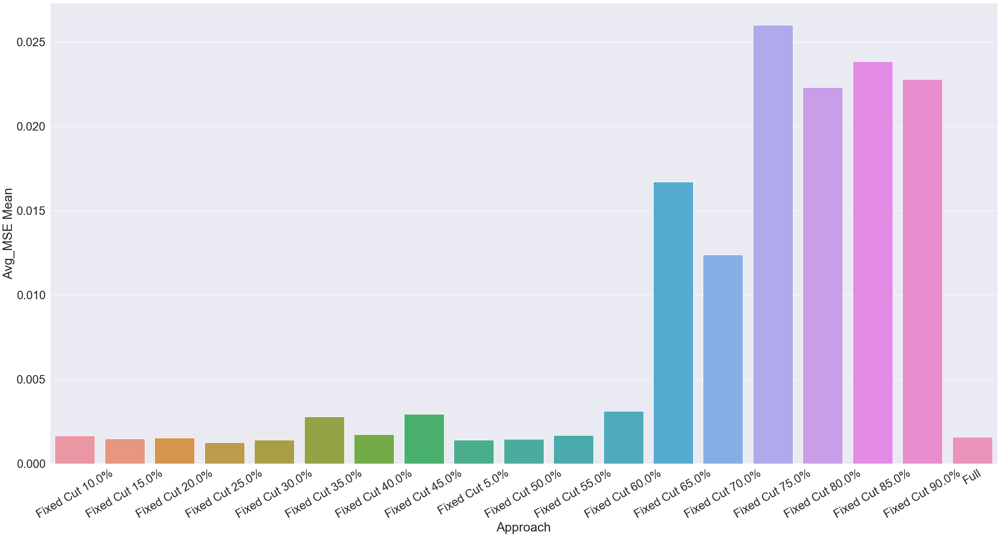

In [98]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

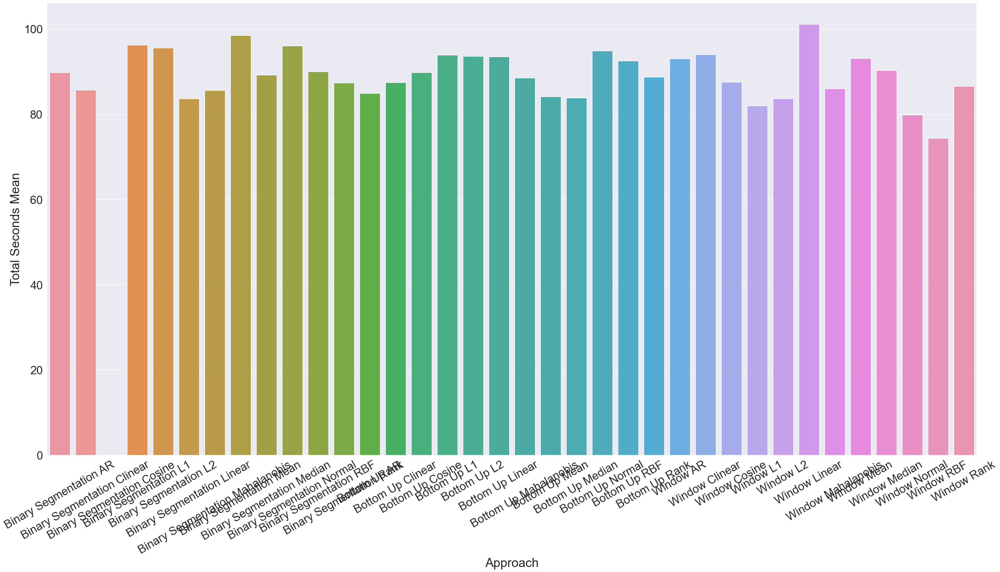

In [99]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

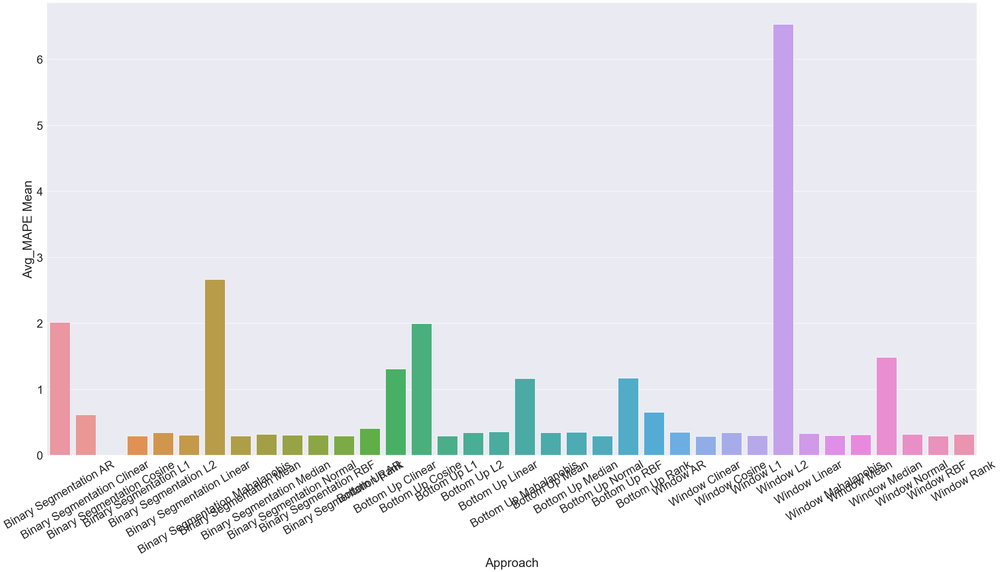

In [100]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

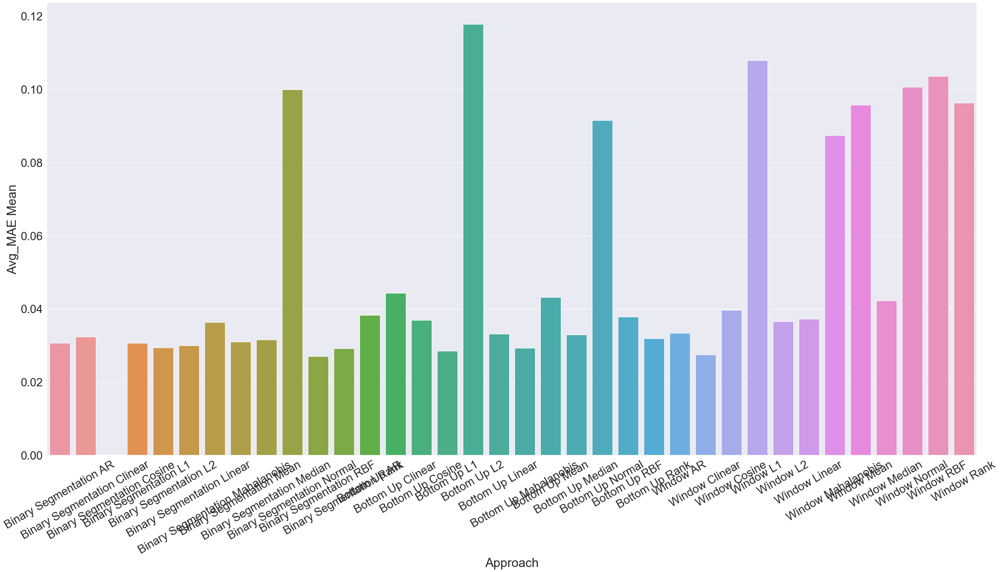

In [101]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

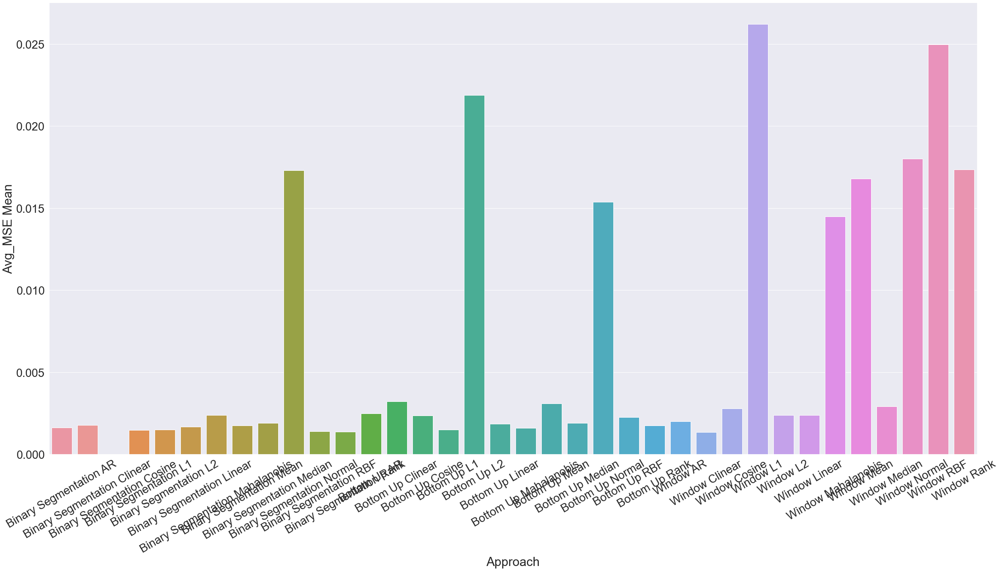

In [102]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [103]:
rank_df = get_rank_df(df)

In [104]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
5,Binary Segmentation Linear,0.394075
20,Bottom Up Median,0.442683
47,Window L2,0.493243
1,Binary Segmentation Clinear,0.496932
11,Binary Segmentation Rank,0.505322
6,Binary Segmentation Mahalanobis,0.561086
18,Bottom Up Mahalanobis,0.561702
12,Bottom Up AR,0.561777
10,Binary Segmentation RBF,0.581381
33,Fixed Cut 50.0%,0.593303


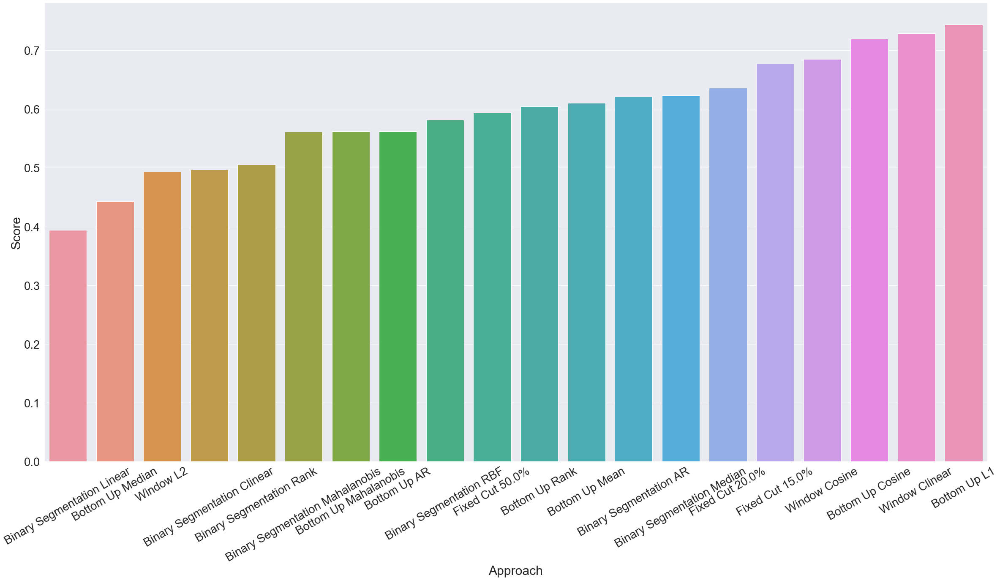

In [105]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [106]:
apple_rank_df = rank_df

## Bee Waggle

In [107]:
shape = pd.read_csv("datasets/tcpd/bee_waggle_6.csv").shape
print(f"Dataset has {shape[0]} rows and {shape[1]} columns")

Dataset has 609 rows and 6 columns


In [108]:
df = get_average_std_df("outputs/TCPD/", "BEE_WAGGLE")
df.head()

,Approach,# Train Mean,# Train Std,# Test Mean,# Test Std,Cut Mean,Cut Std,% Cut Mean,% Cut Std,Cut Seconds Mean,Cut Seconds Std,HPO Seconds Mean,HPO Seconds Std,Train Seconds Mean,Train Seconds Std,Total Seconds Mean,Total Seconds Std,x_MAPE Mean,x_MAPE Std,x_MAE Mean,x_MAE Std,x_MSE Mean,x_MSE Std,y_MAPE Mean,y_MAPE Std,y_MAE Mean,y_MAE Std,y_MSE Mean,y_MSE Std,sin(theta)_MAPE Mean,sin(theta)_MAPE Std,sin(theta)_MAE Mean,sin(theta)_MAE Std,sin(theta)_MSE Mean,sin(theta)_MSE Std,cos(theta)_MAPE Mean,cos(theta)_MAPE Std,cos(theta)_MAE Mean,cos(theta)_MAE Std,cos(theta)_MSE Mean,cos(theta)_MSE Std,Avg_MAPE Mean,Avg_MAPE Std,Avg_MAE Mean,Avg_MAE Std,Avg_MSE Mean,Avg_MSE Std
0,Binary Segmentation AR,312.0,0.0,122.0,0.0,175.0,0.0,35.934292,0.0,0.023271,0.003237,108.210061,15.678764,3.786386,0.825524,112.019718,16.235044,0.063311,0.025036,0.054817,0.018953,0.005279,0.003980,0.052282,0.014627,0.043737,0.010488,0.002820,0.001569,5.627014,3.532335,0.569024,0.030813,0.401745,0.041537,7.162926,11.087669,0.482680,0.029078,0.332497,0.039372,3.226383,3.486399,0.287565,0.013422,0.185585,0.016744
1,Binary Segmentation Clinear,407.0,0.0,122.0,0.0,80.0,0.0,16.427105,0.0,0.013455,0.001731,119.914395,14.213053,6.240240,2.363183,126.168090,15.316619,0.095904,0.014810,0.080714,0.011230,0.008987,0.002229,0.069540,0.017193,0.059145,0.016076,0.005179,0.002760,2.802562,0.687636,0.540008,0.019119,0.376625,0.022706,2.756066,0.570456,0.469884,0.013890,0.316622,0.013399,1.431018,0.298962,0.287438,0.004968,0.176853,0.005856
2,Binary Segmentation Cosine,312.0,0.0,122.0,0.0,175.0,0.0,35.934292,0.0,0.022017,0.004572,115.817681,17.715902,4.581014,0.375546,120.420712,17.846893,0.056081,0.006920,0.050064,0.005998,0.003828,0.000566,0.050725,0.010005,0.044032,0.009382,0.002688,0.001090,6.353863,7.638316,0.559872,0.025805,0.395367,0.032910,2.505612,0.843135,0.485020,0.029584,0.339123,0.033744,2.241570,1.910865,0.284747,0.011737,0.185251,0.015856
3,Binary Segmentation L1,312.0,0.0,122.0,0.0,175.0,0.0,35.934292,0.0,0.029565,0.004170,102.656291,8.194746,3.839790,0.522889,106.525646,8.229126,0.065740,0.005214,0.057903,0.004211,0.004746,0.000805,0.054615,0.017135,0.046853,0.014148,0.003319,0.002270,3.710723,1.555072,0.559076,0.015875,0.393101,0.018742,2.415367,0.951549,0.478069,0.041858,0.331796,0.031449,1.561611,0.364306,0.285475,0.012370,0.183241,0.011302
4,Binary Segmentation L2,257.0,0.0,122.0,0.0,230.0,0.0,47.227926,0.0,0.014304,0.001846,112.135841,11.336418,3.888603,0.803696,116.038748,11.351857,0.059670,0.024421,0.052739,0.019200,0.004200,0.002716,0.053374,0.005210,0.045756,0.004946,0.002830,0.000514,3.761367,0.790398,0.547159,0.049514,0.378510,0.064820,7.473066,7.427333,0.519543,0.014872,0.371588,0.030669,2.836869,1.782440,0.291299,0.018691,0.189282,0.020973


### Fixed cuts

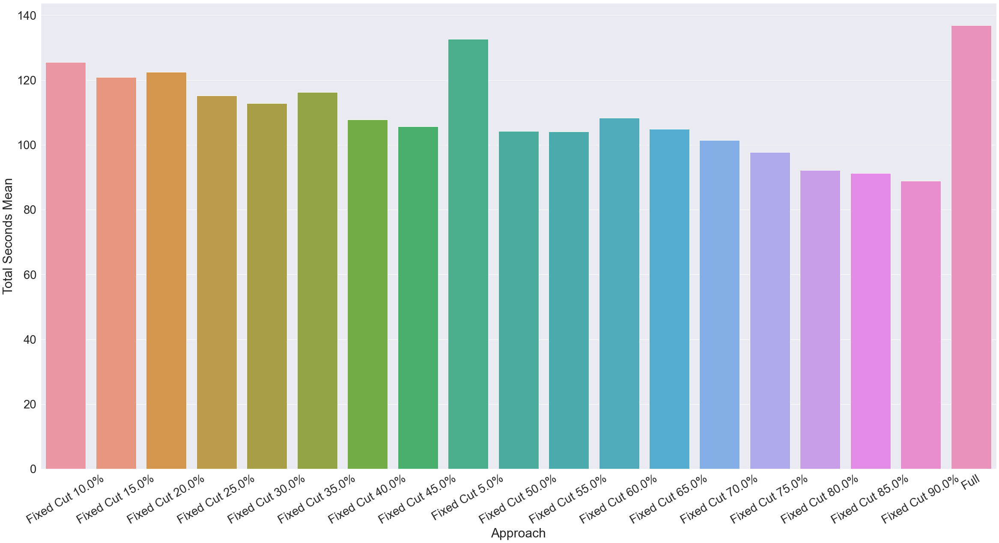

In [109]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

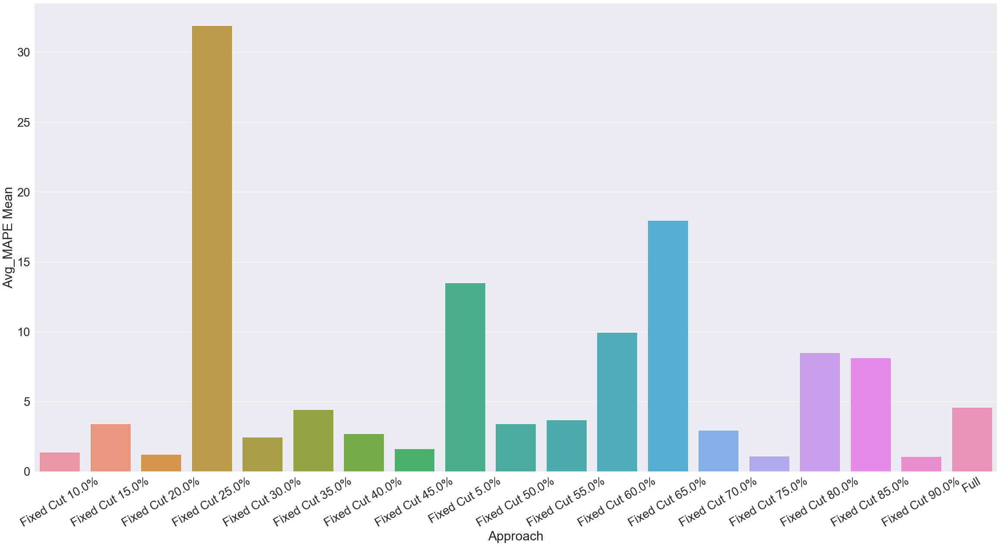

In [110]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

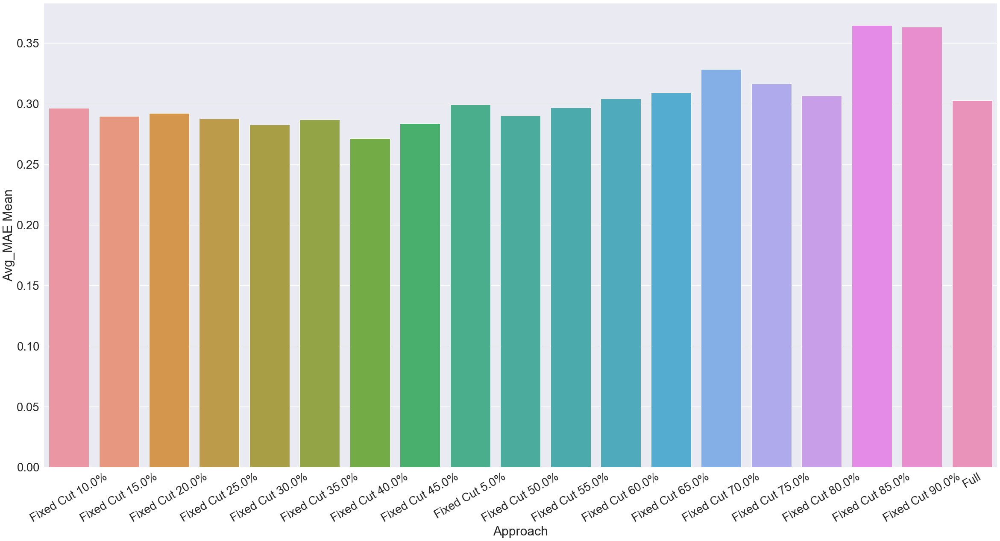

In [111]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

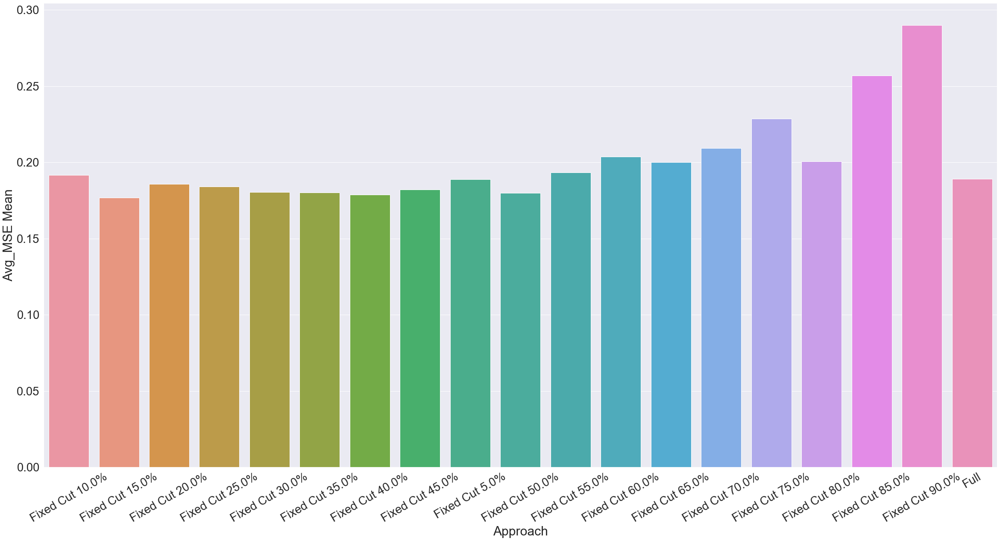

In [112]:
g = sns.barplot(
    data=df[df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Approaches

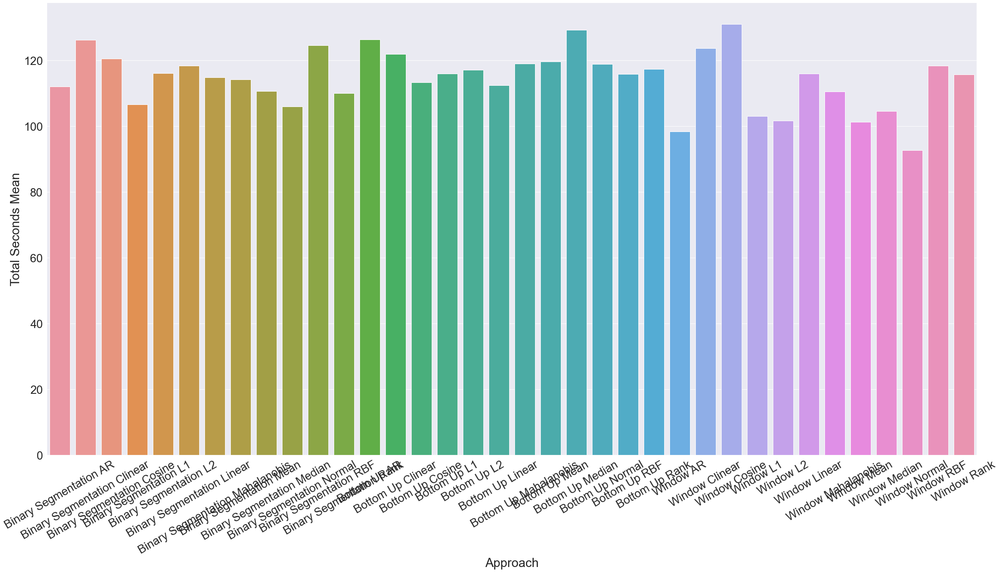

In [113]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=TOTAL_SECONDS_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

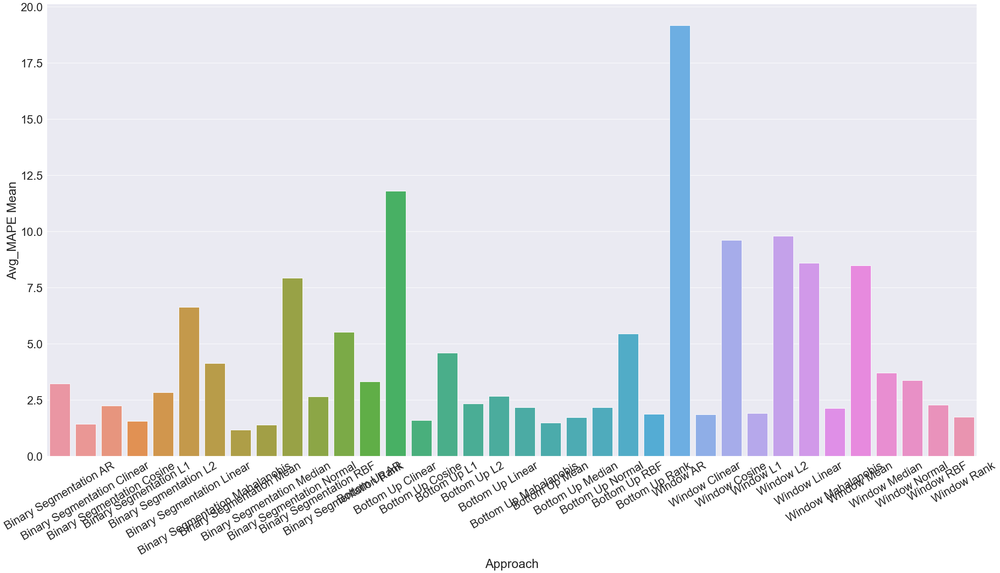

In [114]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAPE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

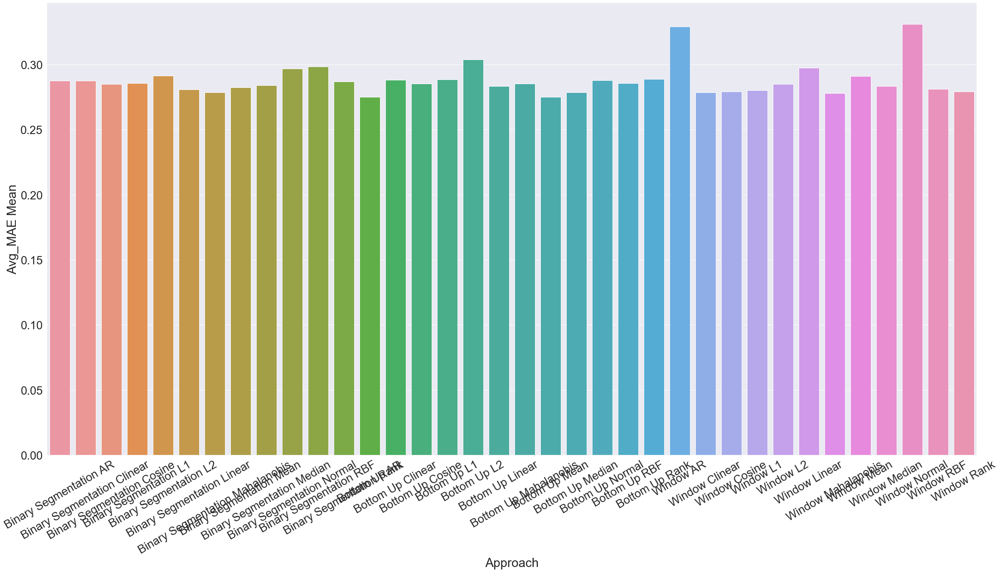

In [115]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MAE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

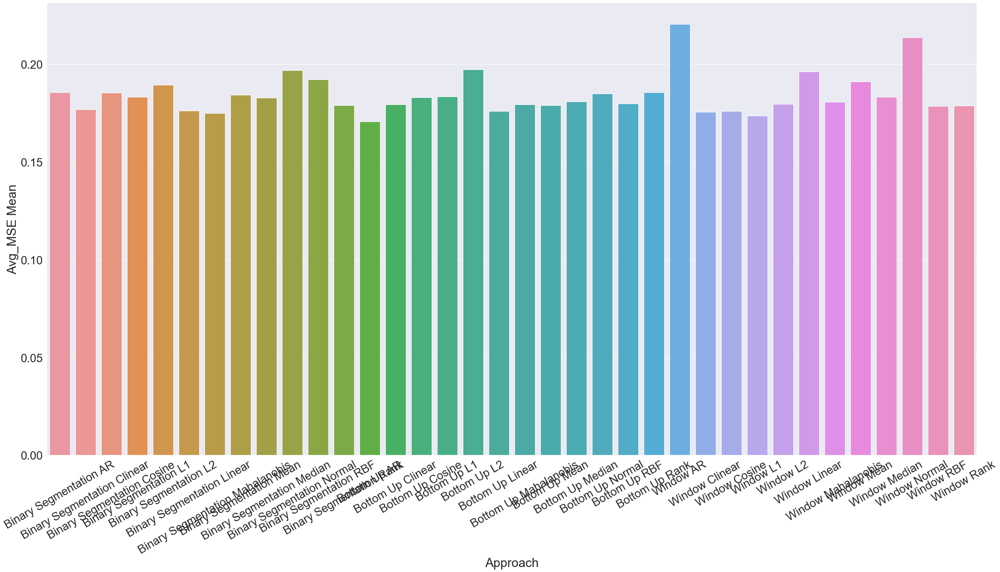

In [116]:
g = sns.barplot(
    data=df[~df[APPROACH_COLUMN].isin(FIXED_APPROACHES)], 
    x=APPROACH_COLUMN, y=AVG_MSE_MEAN_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

### Combine

In [117]:
rank_df = get_rank_df(df)

In [118]:
rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN)

,Approach,Score
46,Window L1,0.416406
30,Fixed Cut 40.0%,0.462607
47,Window L2,0.486340
51,Window Median,0.558875
31,Fixed Cut 45.0%,0.576997
33,Fixed Cut 50.0%,0.595555
49,Window Mahalanobis,0.604654
3,Binary Segmentation L1,0.625448
50,Window Mean,0.638475
6,Binary Segmentation Mahalanobis,0.652280


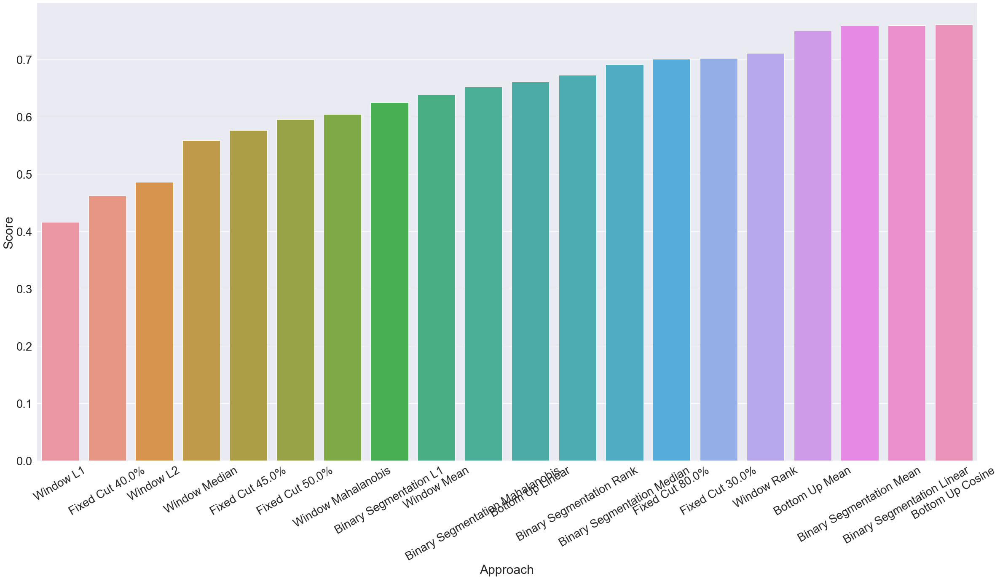

In [119]:
g = sns.barplot(
    data=rank_df[[APPROACH_COLUMN, SCORE_COLUMN]].sort_values(SCORE_COLUMN).head(20), 
    x=APPROACH_COLUMN, y=SCORE_COLUMN
)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.gcf().set_size_inches(40,20)

In [120]:
bee_waggle_rank_df = rank_df

## All Datasets

In [121]:
approaches = embrapa_rank_df[APPROACH_COLUMN]
dfs = [embrapa_rank_df[RANK_COLUMN], prsa_beijing_rank_df[RANK_COLUMN], air_quality_rank_df[RANK_COLUMN], 
       brasilia_rank_df[RANK_COLUMN], cristalina_rank_df[RANK_COLUMN], ibirite_rank_df[RANK_COLUMN], 
       apple_rank_df[RANK_COLUMN], bee_waggle_rank_df[RANK_COLUMN]]
dfs = pd.concat(dfs, axis=1)
means = dfs.mean(axis=1)
stds = dfs.std(axis=1)
ranks = means.rank(ascending=True)

In [122]:
result_df = pd.DataFrame({
    APPROACH_COLUMN: approaches,
    RANK_COLUMN: ranks,
    'Mean': means,
    'Std': stds
})

In [123]:
result_df.sort_values(RANK_COLUMN)

,Approach,Rank,Mean,Std
39,Fixed Cut 80.0%,1.0,15.750000,14.772078
11,Binary Segmentation Rank,2.0,17.000000,11.199490
34,Fixed Cut 55.0%,3.0,17.125000,7.754031
35,Fixed Cut 60.0%,4.0,17.250000,14.250313
15,Bottom Up L1,5.0,17.500000,13.989792
5,Binary Segmentation Linear,6.0,17.571429,14.292855
19,Bottom Up Mean,7.0,18.000000,6.502747
33,Fixed Cut 50.0%,8.0,18.375000,14.151603
36,Fixed Cut 65.0%,9.0,18.500000,16.758793
49,Window Mahalanobis,10.0,18.625000,11.375883


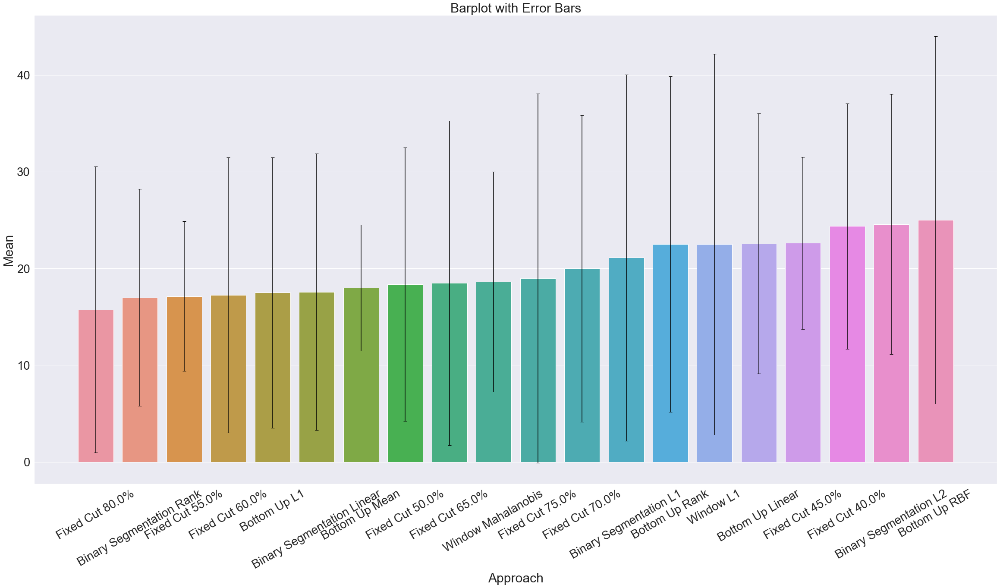

In [124]:
plt.figure(figsize=(40,20))

sub_result_df = result_df.sort_values(RANK_COLUMN).head(20)

# Plot the barplot
sns.barplot(x=APPROACH_COLUMN, y="Mean", data=sub_result_df, ci=None)

# Add error bars based on Std
plt.errorbar(x=sub_result_df[APPROACH_COLUMN], y=sub_result_df["Mean"], yerr=sub_result_df["Std"], fmt='none', color='black', capsize=4)

# Add labels and title
plt.xlabel(APPROACH_COLUMN)
plt.ylabel("Mean")
plt.title("Barplot with Error Bars")

plt.xticks(rotation=30)

# Display the plot
plt.show()